In [ ]:
# /Users/veronicamorelli/anaconda3/envs/BigDataGIS/bin/python prova.py

# Make the import with temperature.nc

# Exploring Global Temperature in the ERA of Climate Change

* Add Description
* Add Why I chose this data and this model (add some characteristics of the model)

## Data Description

### Observations

### Climate Model

In [1]:
# Import libraries
import json
import numpy as np
import pandas as pd
import matplotlib as mpl
import matplotlib.pyplot as plt
from matplotlib import ticker
import matplotlib.dates as mdates
from tqdm import tqdm
from datetime import datetime
import warnings
# import cv2
# import xesmf as xe

import xarray as xr
import cartopy.crs as ccrs
import cartopy.feature as cf
import geopandas as gpd
import cftime

from scipy import stats

# To make visualization better
%matplotlib inline
%config InlineBackend.figure_format='retina'

# Set plot size
plt.rcParams['figure.figsize'] = [8, 4]

# To ignore all warnings
warnings.filterwarnings("ignore")

## Data Import

### ERA5 Temperature (monthly, 1950-2022)

The ERA5 dataset provides high resolution daily atmospheric pressure information from 1940 till now. Produced by the European Centre for Medium-Range Weather Forecasts (ECMWF), ERA5 represents a state-of-the-art reanalysis dataset that combines observational data with advanced modeling techniques. 2m temperature (surface temperature) monthly measurement from January 1950 to December 2022 has been downloaded. Temperature daily measurements were to heavy to be supported by my computer. You can find the code in `api\api_monthly_temperature.py` script. Totally there are 886 measuremets ($73 \cdot 12 = 876$)

In [3]:
path1_temp = 'Dataset/download_temperature_50_84.nc'
temp1 = xr.open_dataset(path1_temp)
temp1

<xarray.Dataset>
Dimensions:    (longitude: 1440, latitude: 721, time: 420)
Coordinates:
  * longitude  (longitude) float32 0.0 0.25 0.5 0.75 ... 359.0 359.2 359.5 359.8
  * latitude   (latitude) float32 90.0 89.75 89.5 89.25 ... -89.5 -89.75 -90.0
  * time       (time) datetime64[ns] 1950-01-01 1950-02-01 ... 1984-12-01
Data variables:
    t2m        (time, latitude, longitude) float32 ...
Attributes:
    Conventions:  CF-1.6
    history:      2023-12-06 15:35:43 GMT by grib_to_netcdf-2.25.1: /opt/ecmw...

In [4]:
temp1.time[0].values, temp1.time[-1].values

(numpy.datetime64('1950-01-01T00:00:00.000000000'),
 numpy.datetime64('1984-12-01T00:00:00.000000000'))

In [5]:
path2_temp = 'Dataset/download_temperature_85_23.nc'
temp2 = xr.open_dataset(path2_temp)
temp2

<xarray.Dataset>
Dimensions:    (longitude: 1440, latitude: 721, time: 456)
Coordinates:
  * longitude  (longitude) float32 0.0 0.25 0.5 0.75 ... 359.0 359.2 359.5 359.8
  * latitude   (latitude) float32 90.0 89.75 89.5 89.25 ... -89.5 -89.75 -90.0
  * time       (time) datetime64[ns] 1985-01-01 1985-02-01 ... 2022-12-01
Data variables:
    t2m        (time, latitude, longitude) float32 ...
Attributes:
    Conventions:  CF-1.6
    history:      2023-12-06 15:24:22 GMT by grib_to_netcdf-2.25.1: /opt/ecmw...

In [6]:
temp2.time[0].values, temp2.time[-1].values

(numpy.datetime64('1985-01-01T00:00:00.000000000'),
 numpy.datetime64('2022-12-01T00:00:00.000000000'))

The dataset has size of 1440 points in longitude and 721 points in latitude, the approximate spatial resolution is calculated as follows:

- Latitude resolution = 360 degrees / 721 ≈ 0.4993 degrees
- Longitude resolution = 360 degrees / 1440 ≈ 0.25 degrees

Therefore, the approximate spatial resolution for your dataset is approximately 0.4993 degrees in latitude and 0.25 degrees in longitude.

**Concatenation**

In [7]:
temp = xr.concat([temp1, temp2], dim='time')
temp

<xarray.Dataset>
Dimensions:    (longitude: 1440, latitude: 721, time: 876)
Coordinates:
  * longitude  (longitude) float32 0.0 0.25 0.5 0.75 ... 359.0 359.2 359.5 359.8
  * latitude   (latitude) float32 90.0 89.75 89.5 89.25 ... -89.5 -89.75 -90.0
  * time       (time) datetime64[ns] 1950-01-01 1950-02-01 ... 2022-12-01
Data variables:
    t2m        (time, latitude, longitude) float32 241.5 241.5 ... 244.5 244.5
Attributes:
    Conventions:  CF-1.6
    history:      2023-12-06 15:35:43 GMT by grib_to_netcdf-2.25.1: /opt/ecmw...

In [8]:
temp.time[0].values, temp.time[-1].values

(numpy.datetime64('1950-01-01T00:00:00.000000000'),
 numpy.datetime64('2022-12-01T00:00:00.000000000'))

In [10]:
# Save
temp.to_netcdf('Dataset/temperature.nc')

#### **Longitude Conversion**

From this output I notice that latitude and longitude refer to cells centroid but the longitude range is [0, 359]. I convert longitude coordinates to [-180, 179] range.

The reason for this adjustment is to bring the longitude values to a standard range that is more commonly used in geosciences and GIS applications.

In the original ERA5 dataset, the longitude values are provided in the [0, 359] range, where 0 represents the Prime Meridian, and the values increase to the east until reaching 359. This convention is sometimes used in climate models and meteorological data. However, it's more common in many geospatial applications to represent longitudes in the range [-180, 180], where negative values represent west of the Prime Meridian, and positive values represent east.

Converting longitudes to the [-180, 180] range makes it easier to work with the data, especially when combining datasets, mapping, or performing spatial analyses. It aligns with the standard used in many GIS tools and libraries.

In [9]:
# Change longitude definition from [0, 360] to [-180, 180] 
temp['longitude_bnds'] = (temp.longitude + 180) % 360 - 180  # boundaries
temp = temp.assign_coords(longitude=temp.longitude_bnds).sortby('longitude')  # coordinates
temp = temp.sortby('latitude', ascending=False)  # sort by lat
temp

<xarray.Dataset>
Dimensions:         (longitude: 1440, latitude: 721, time: 876)
Coordinates:
  * longitude       (longitude) float32 -180.0 -179.8 -179.5 ... 179.5 179.8
  * latitude        (latitude) float32 90.0 89.75 89.5 ... -89.5 -89.75 -90.0
  * time            (time) datetime64[ns] 1950-01-01 1950-02-01 ... 2022-12-01
Data variables:
    t2m             (time, latitude, longitude) float32 241.5 241.5 ... 244.5
    longitude_bnds  (longitude) float32 -180.0 -179.8 -179.5 ... 179.5 179.8
Attributes:
    Conventions:  CF-1.6
    history:      2023-12-06 15:35:43 GMT by grib_to_netcdf-2.25.1: /opt/ecmw...

#### **Some analysis**

In [12]:
print("Dimensions and Sizes:")
print(temp.dims)

print('---------------------------')

print("Coordinates:")
print(temp.coords)

print('---------------------------')

print("Attributes:")
print(temp.attrs)

print('---------------------------')

print(temp.data_vars)

Dimensions and Sizes:
Frozen({'longitude': 1440, 'latitude': 721, 'time': 876})
---------------------------
Coordinates:
Coordinates:
  * longitude  (longitude) float32 -180.0 -179.8 -179.5 ... 179.2 179.5 179.8
  * latitude   (latitude) float32 90.0 89.75 89.5 89.25 ... -89.5 -89.75 -90.0
  * time       (time) datetime64[ns] 1950-01-01 1950-02-01 ... 2022-12-01
---------------------------
Attributes:
{'Conventions': 'CF-1.6', 'history': '2023-12-06 15:35:43 GMT by grib_to_netcdf-2.25.1: /opt/ecmwf/mars-client/bin/grib_to_netcdf.bin -S param -o /cache/data6/adaptor.mars.internal-1701876927.5603483-31998-9-b7c970fe-2f51-4d29-a310-d353ee49ca37.nc /cache/tmp/b7c970fe-2f51-4d29-a310-d353ee49ca37-adaptor.mars.internal-1701876809.7885528-31998-16-tmp.grib'}
---------------------------
Data variables:
    t2m             (time, latitude, longitude) float32 241.5 241.5 ... 244.5
    longitude_bnds  (longitude) float32 -180.0 -179.8 -179.5 ... 179.5 179.8


In [13]:
print(temp.t2m.coords)

Coordinates:
  * longitude  (longitude) float32 -180.0 -179.8 -179.5 ... 179.2 179.5 179.8
  * latitude   (latitude) float32 90.0 89.75 89.5 89.25 ... -89.5 -89.75 -90.0
  * time       (time) datetime64[ns] 1950-01-01 1950-02-01 ... 2022-12-01


In [14]:
temp.t2m[0].coords['time']

<xarray.DataArray 'time' ()>
array('1950-01-01T00:00:00.000000000', dtype='datetime64[ns]')
Coordinates:
    time     datetime64[ns] 1950-01-01
Attributes:
    long_name:  time

### MPI-ESM1-2-LR ssp126 (2015-2050) 

In [15]:
path_model = 'Dataset/MPI-ESM1-2-LR/ts_Amon_MPI-ESM1-2-LR_ssp126_r1i1p1f1_gn_20150116-20501216_v20190710.nc'
model = xr.open_dataset(path_model)
model

<xarray.Dataset>
Dimensions:    (time: 432, bnds: 2, lat: 96, lon: 192)
Coordinates:
  * time       (time) datetime64[ns] 2015-01-16T12:00:00 ... 2050-12-16T12:00:00
  * lat        (lat) float64 -88.57 -86.72 -84.86 -83.0 ... 84.86 86.72 88.57
  * lon        (lon) float64 0.0 1.875 3.75 5.625 ... 352.5 354.4 356.2 358.1
Dimensions without coordinates: bnds
Data variables:
    time_bnds  (time, bnds) datetime64[ns] ...
    lat_bnds   (time, lat, bnds) float64 ...
    lon_bnds   (time, lon, bnds) float64 ...
    ts         (time, lat, lon) float32 ...
Attributes: (12/47)
    Conventions:            CF-1.7 CMIP-6.2
    activity_id:            ScenarioMIP
    branch_method:          standard
    branch_time_in_child:   60265.0
    branch_time_in_parent:  60265.0
    contact:                cmip6-mpi-esm@dkrz.de
    ...                     ...
    title:                  MPI-ESM1-2-LR output prepared for CMIP6
    variable_id:            ts
    variant_label:          r1i1p1f1
    license:                CMIP6 model data produced by MPI-M is licensed un...
    cmor_version:           3.5.0
    tracking_id:            hdl:21.14100/47b33dbd-7fcd-4f09-abcf-25202400ba8c

In [16]:
model.time[0].values, model.time[-1].values

(numpy.datetime64('2015-01-16T12:00:00.000000000'),
 numpy.datetime64('2050-12-16T12:00:00.000000000'))

#### **Longitude Conversion**

From this output I notice that latitude and longitude refer to cells centroid but the longitude range is [0, 359]. I convert longitude coordinates to [-180, 179] range. I apply the same operation done for ERA5 Temperature.

In [17]:
# Change longitude definition from [0, 360] to [-180, 180] for the model
model['lon_bnds'] = (model.lon_bnds + 180) % 360 - 180  # boundaries
model = model.assign_coords(lon=(model.lon + 180) % 360 - 180).sortby('lon')  # coordinates
model = model.sortby('lat', ascending=False)  # sort by lat

In [18]:
model

<xarray.Dataset>
Dimensions:    (time: 432, bnds: 2, lat: 96, lon: 192)
Coordinates:
  * time       (time) datetime64[ns] 2015-01-16T12:00:00 ... 2050-12-16T12:00:00
  * lat        (lat) float64 88.57 86.72 84.86 83.0 ... -84.86 -86.72 -88.57
  * lon        (lon) float64 -180.0 -178.1 -176.2 -174.4 ... 174.4 176.2 178.1
Dimensions without coordinates: bnds
Data variables:
    time_bnds  (time, bnds) datetime64[ns] ...
    lat_bnds   (time, lat, bnds) float64 ...
    lon_bnds   (time, lon, bnds) float64 179.1 -179.1 -179.1 ... 177.2 179.1
    ts         (time, lat, lon) float32 ...
Attributes: (12/47)
    Conventions:            CF-1.7 CMIP-6.2
    activity_id:            ScenarioMIP
    branch_method:          standard
    branch_time_in_child:   60265.0
    branch_time_in_parent:  60265.0
    contact:                cmip6-mpi-esm@dkrz.de
    ...                     ...
    title:                  MPI-ESM1-2-LR output prepared for CMIP6
    variable_id:            ts
    variant_label:          r1i1p1f1
    license:                CMIP6 model data produced by MPI-M is licensed un...
    cmor_version:           3.5.0
    tracking_id:            hdl:21.14100/47b33dbd-7fcd-4f09-abcf-25202400ba8c

#### **Some Analysis**

In [19]:
print("Dimensions and Sizes:")
print(model.dims)

print('---------------------------')

print("Coordinates:")
print(model.coords)

print('---------------------------')

print("Attributes:")
print(model.attrs)

print('---------------------------')

print(model.data_vars)

Dimensions and Sizes:
Frozen({'time': 432, 'bnds': 2, 'lat': 96, 'lon': 192})
---------------------------
Coordinates:
Coordinates:
  * time     (time) datetime64[ns] 2015-01-16T12:00:00 ... 2050-12-16T12:00:00
  * lat      (lat) float64 88.57 86.72 84.86 83.0 ... -83.0 -84.86 -86.72 -88.57
  * lon      (lon) float64 -180.0 -178.1 -176.2 -174.4 ... 174.4 176.2 178.1
---------------------------
Attributes:
{'Conventions': 'CF-1.7 CMIP-6.2', 'activity_id': 'ScenarioMIP', 'branch_method': 'standard', 'branch_time_in_child': 60265.0, 'branch_time_in_parent': 60265.0, 'contact': 'cmip6-mpi-esm@dkrz.de', 'creation_date': '2019-10-29T16:19:11Z', 'data_specs_version': '01.00.30', 'experiment': 'update of RCP2.6 based on SSP1', 'experiment_id': 'ssp126', 'external_variables': 'areacella', 'forcing_index': 1, 'frequency': 'mon', 'further_info_url': 'https://furtherinfo.es-doc.org/CMIP6.MPI-M.MPI-ESM1-2-LR.ssp126.none.r1i1p1f1', 'grid': 'gn', 'grid_label': 'gn', 'history': '2019-10-29T16:19:11Z ;

In [20]:
model.ts[0]

<xarray.DataArray 'ts' (lat: 96, lon: 192)>
[18432 values with dtype=float32]
Coordinates:
    time     datetime64[ns] 2015-01-16T12:00:00
  * lat      (lat) float64 88.57 86.72 84.86 83.0 ... -83.0 -84.86 -86.72 -88.57
  * lon      (lon) float64 -180.0 -178.1 -176.2 -174.4 ... 174.4 176.2 178.1
Attributes:
    standard_name:  surface_temperature
    long_name:      Surface Temperature
    comment:        Temperature of the lower boundary of the atmosphere
    units:          K
    cell_methods:   area: time: mean
    cell_measures:  area: areacella
    history:        2019-10-29T16:19:11Z altered by CMOR: replaced missing va...

In [21]:
print(model.ts.coords)

Coordinates:
  * time     (time) datetime64[ns] 2015-01-16T12:00:00 ... 2050-12-16T12:00:00
  * lat      (lat) float64 88.57 86.72 84.86 83.0 ... -83.0 -84.86 -86.72 -88.57
  * lon      (lon) float64 -180.0 -178.1 -176.2 -174.4 ... 174.4 176.2 178.1


In [22]:
model.ts[0].coords['time']

<xarray.DataArray 'time' ()>
array('2015-01-16T12:00:00.000000000', dtype='datetime64[ns]')
Coordinates:
    time     datetime64[ns] 2015-01-16T12:00:00
Attributes:
    bounds:         time_bnds
    axis:           T
    long_name:      time
    standard_name:  time

## Data Visualizations

### ERA5 2m Temperature (1950-2020)

Text(0.5, 1.0, 'ERA5 Mean Temperature 1950-2023')

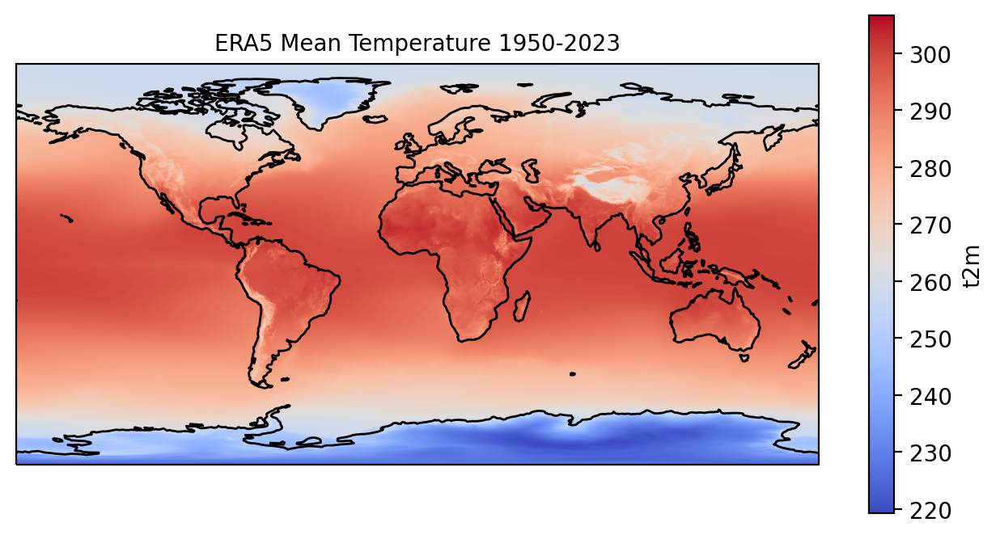

In [24]:
fig = plt.figure(1, figsize=[8,4])

ax = plt.subplot(1, 1, 1, projection=ccrs.PlateCarree())
ax.coastlines()

temp.t2m.mean(dim='time').plot.pcolormesh(ax=ax, cmap='coolwarm')
plt.title("ERA5 Mean Temperature 1950-2023", fontsize=10)

In [25]:
lat = temp.t2m.coords['latitude'].values
lon = temp.t2m.coords['longitude'].values
t2m_mean = temp.t2m.mean(dim='time')

In [26]:
t2m_mean_df = pd.DataFrame(t2m_mean, lat, lon)

In [27]:
t2m_mean_df

,-180.00,-179.75,-179.50,-179.25,-179.00,-178.75,-178.50,-178.25,-178.00,-177.75,...,177.50,177.75,178.00,178.25,178.50,178.75,179.00,179.25,179.50,179.75
90.00,258.284973,258.284973,258.284973,258.284973,258.284973,258.284973,258.284973,258.284973,258.284973,258.284973,...,258.284973,258.284973,258.284973,258.284973,258.284973,258.284973,258.284973,258.284973,258.284973,258.284973
89.75,258.236755,258.236511,258.236237,258.235992,258.235748,258.235474,258.235260,258.234985,258.234955,258.234924,...,258.239044,258.238892,258.238739,258.238556,258.238251,258.238037,258.237762,258.237488,258.237274,258.237030
89.50,258.225311,258.224823,258.224304,258.223785,258.223297,258.222778,258.222290,258.221741,258.221283,258.220734,...,258.230316,258.229797,258.229309,258.228790,258.228302,258.227783,258.227325,258.226807,258.226318,258.225800
89.25,258.250488,258.249664,258.248749,258.247650,258.246460,258.245361,258.244232,258.243042,258.241852,258.240753,...,258.255768,258.255249,258.254791,258.254242,258.253784,258.253296,258.252869,258.252319,258.251831,258.251190
89.00,258.236969,258.235565,258.234222,258.232880,258.231476,258.230133,258.228821,258.227478,258.226105,258.224792,...,258.243896,258.243195,258.242462,258.241791,258.241089,258.240356,258.239716,258.239014,258.238342,258.237671
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
-89.00,226.847107,226.851974,226.856812,226.861694,226.866623,226.871506,226.876358,226.881271,226.886169,226.891022,...,226.757385,226.766342,226.775314,226.784286,226.793259,226.802216,226.811218,226.820190,226.829163,226.838120
-89.25,226.848923,226.854141,226.859085,226.863663,226.868164,226.872681,226.877258,226.881775,226.886383,226.890930,...,226.765427,226.774323,226.783173,226.792130,226.801071,226.809998,226.818878,226.827942,226.836868,226.843643
-89.50,226.970963,226.974487,226.978012,226.981552,226.985016,226.988556,226.992065,226.995605,226.999176,227.002716,...,226.936111,226.939575,226.943024,226.946518,226.949982,226.953476,226.956970,226.960419,226.963928,226.967453
-89.75,227.077484,227.079254,227.080948,227.082748,227.084503,227.086273,227.088043,227.089783,227.090134,227.090134,...,227.063034,227.063660,227.064377,227.065262,227.067001,227.068695,227.070496,227.072235,227.074020,227.075760


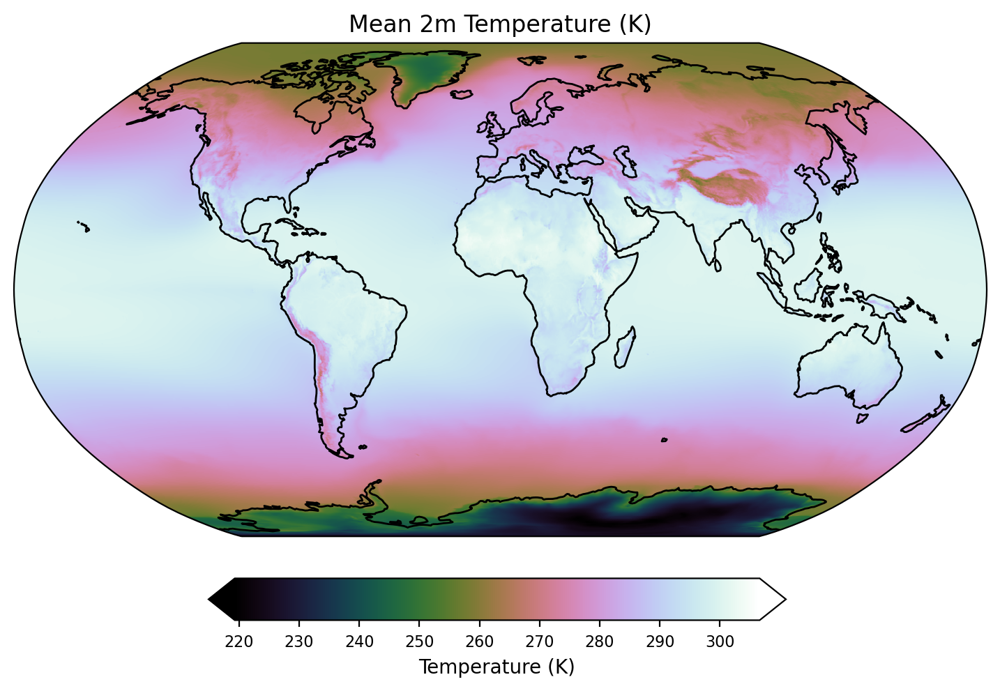

In [28]:
fig = plt.figure(figsize=(9,6))  # x,y(inches)

ax = plt.axes(projection=ccrs.Robinson())
ax.set_global()
ax.set_title('Mean 2m Temperature (K)')

mm = ax.pcolormesh(t2m_mean_df.columns, # longitude
                   t2m_mean_df.index, # latitude
                   t2m_mean_df, # data
                   shading='auto', \
                   transform=ccrs.PlateCarree(),
                   cmap=mpl.cm.cubehelix )

# more color palettes here:
#   https://matplotlib.org/3.1.3/tutorials/colors/colormaps.html

ax.coastlines()

#- add colorbar
cbar_ax = fig.add_axes([0.28, 0.10, 0.46, 0.05]) #[left, bottom, width, height]
cbar = fig.colorbar(mm, cax=cbar_ax, extend='both', orientation='horizontal')
cbar.set_label('Temperature (K)') #($\mu g$ $m^{-3}$)
cbar.ax.tick_params(labelsize=8)

plt.show()
plt.close()

In [31]:
temp.time[-1]

<xarray.DataArray 'time' ()>
array('2022-12-01T00:00:00.000000000', dtype='datetime64[ns]')
Coordinates:
    time     datetime64[ns] 2022-12-01
Attributes:
    long_name:  time

In [33]:
temp.sel(time='2022-12-01T00:00:00.000000000')

<xarray.Dataset>
Dimensions:         (longitude: 1440, latitude: 721)
Coordinates:
  * longitude       (longitude) float32 -180.0 -179.8 -179.5 ... 179.5 179.8
  * latitude        (latitude) float32 90.0 89.75 89.5 ... -89.5 -89.75 -90.0
    time            datetime64[ns] 2022-12-01
Data variables:
    t2m             (latitude, longitude) float32 249.8 249.8 ... 244.5 244.5
    longitude_bnds  (longitude) float32 -180.0 -179.8 -179.5 ... 179.5 179.8
Attributes:
    Conventions:  CF-1.6
    history:      2023-12-06 15:35:43 GMT by grib_to_netcdf-2.25.1: /opt/ecmw...

Text(0, 0.5, 'K')

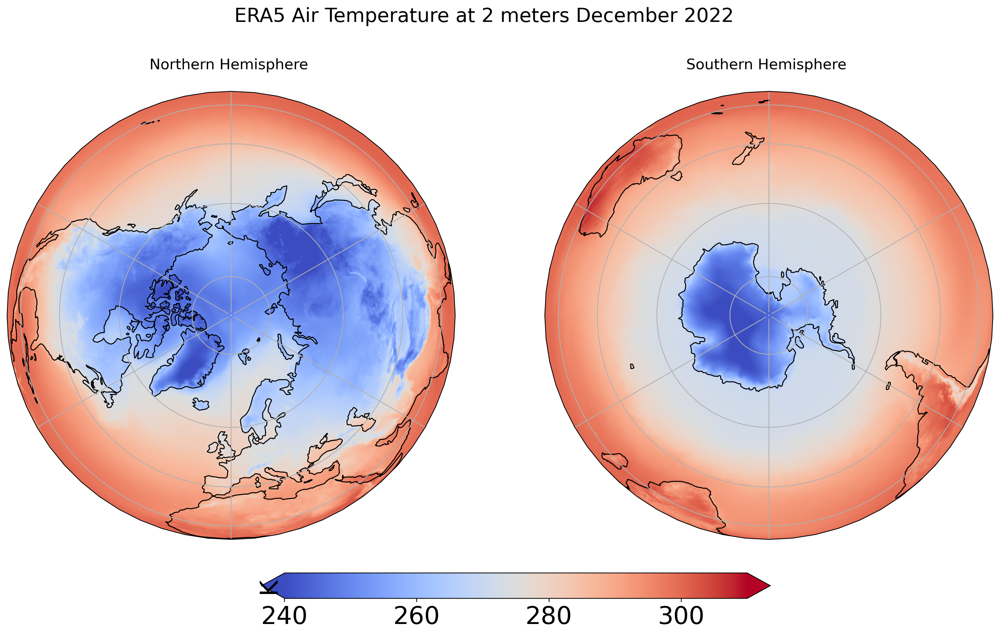

In [86]:
# Combine plot with different projections
fig = plt.figure(1, figsize=[18,9])

# Fix extent
minval = 240
maxval = 310

# Plot 1 for Northern Hemisphere subplot argument (nrows, ncols, nplot)
# here 1 row, 2 columns and 1st plot
ax1 = plt.subplot(1, 2, 1, projection=ccrs.Orthographic(0, 90))

# Plot 2 for Southern Hemisphere
# 2nd plot 
ax2 = plt.subplot(1, 2, 2, projection=ccrs.Orthographic(180, -90))

tsel = 0
for ax,t in zip([ax1, ax2], ["Northern", "Southern"]):
    map = temp.t2m.sel(time='2022-12-01T00:00:00.000000000').plot(ax=ax, vmin=minval, vmax=maxval, 
                                                             transform=ccrs.PlateCarree(), 
                                                             cmap='coolwarm', 
                                                             add_colorbar=False)
    ax.set_title(t + " Hemisphere \n" , fontsize=15)
    ax.coastlines()
    ax.gridlines()

# Title for both plots
fig.suptitle('ERA5 Air Temperature at 2 meters December 2022', fontsize=20)


cb_ax = fig.add_axes([0.325, 0.05, 0.4, 0.04])

cbar = plt.colorbar(map, cax=cb_ax, extend='both', orientation='horizontal', fraction=0.046, pad=0.04)
cbar.ax.tick_params(labelsize=25)
cbar.ax.set_ylabel('K', fontsize=25)

In [ ]:
# Combine plot with different projections
fig = plt.figure(1, figsize=[18,9])

# Fix extent
minval = 220
maxval = 340

# Plot 1 for Northern Hemisphere subplot argument (nrows, ncols, nplot)
# here 1 row, 2 columns and 1st plot
ax1 = plt.subplot(1, 2, 1, projection=ccrs.Orthographic(0, 90))

# Plot 2 for Southern Hemisphere
# 2nd plot 
ax2 = plt.subplot(1, 2, 2, projection=ccrs.Orthographic(180, -90))

tsel = 0
for ax,t in zip([ax1, ax2], ["Northern", "Southern"]):
    map = t2m_mean.plot(ax=ax, vmin=minval, vmax=maxval, 
                                                             transform=ccrs.PlateCarree(), 
                                                             cmap='coolwarm', 
                                                             add_colorbar=False)
    ax.set_title(t + " Hemisphere \n" , fontsize=15)
    ax.coastlines()
    ax.gridlines()

# Title for both plots
fig.suptitle('ERA5 Mean Air Temperature at 2 meters (K)', fontsize=20)


cb_ax = fig.add_axes([0.325, 0.05, 0.4, 0.04])

cbar = plt.colorbar(map, cax=cb_ax, extend='both', orientation='horizontal', fraction=0.046, pad=0.04)
cbar.ax.tick_params(labelsize=25)
cbar.ax.set_ylabel('K', fontsize=25)

Text(0.5, 1.0, '2m Temperature (K) from 1950 to 2022 per Emisphere')

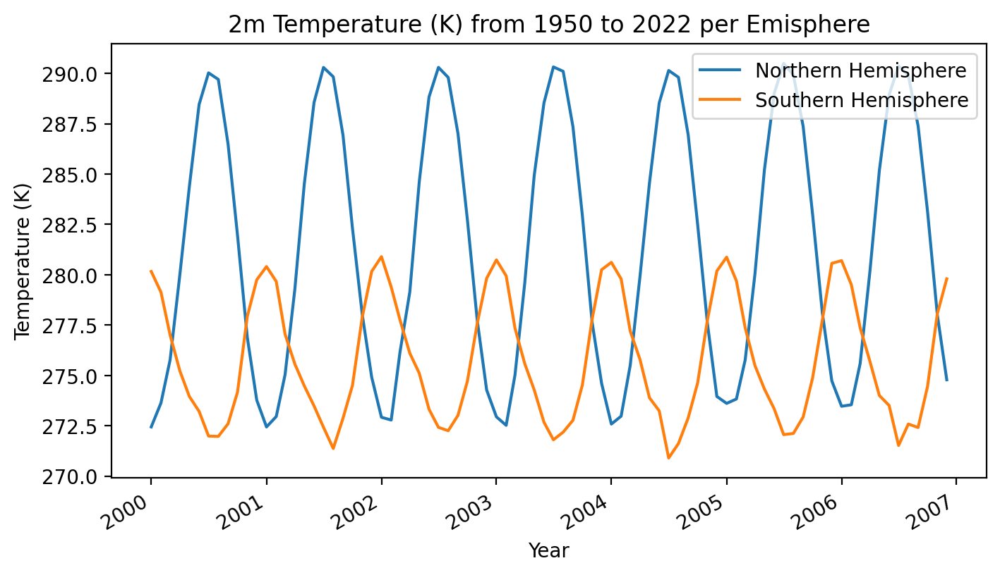

In [41]:
# Plot the mean values of the scenario over longitude and latitude (separating the emispheres)
temp.where(temp.latitude > 0).sel({'time': slice('2000', '2006')}).mean(['latitude', 'longitude']).t2m.plot(label='Northern Hemisphere')
temp.where(temp.latitude < 0).sel({'time': slice('2000', '2006')}).mean(['latitude', 'longitude']).t2m.plot(label='Southern Hemisphere')
plt.xlabel('Year')
plt.ylabel('Temperature (K)')
plt.legend()
plt.title('2m Temperature (K) from 1950 to 2022 per Emisphere')

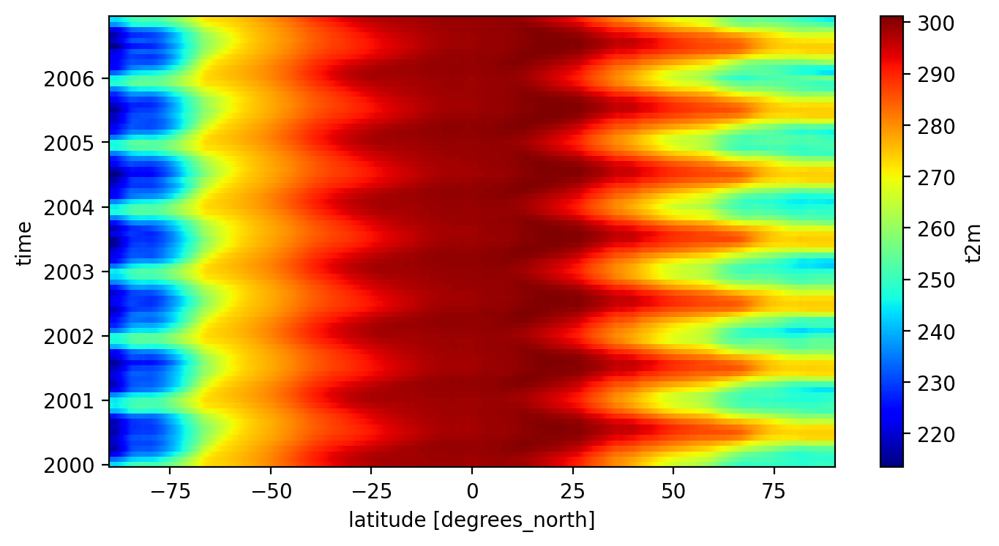

In [42]:
temp.sel({'time': slice('2000', '2006')}).t2m.mean(dim='longitude').plot(cmap='jet')

In [55]:
# Compute the average yearly temperature 
# first mean of all year, mean between all years, and mean on lat lon
annual_mean_temperature = temp.t2m.resample(time='Y', label='right').mean(dim='time').mean(dim='time').mean().values
print('The Annual Mean Temperature between 1950 and 2022 is:', annual_mean_temperature)

The Annual Mean Temperature between 1950 and 2022 is: 278.19336


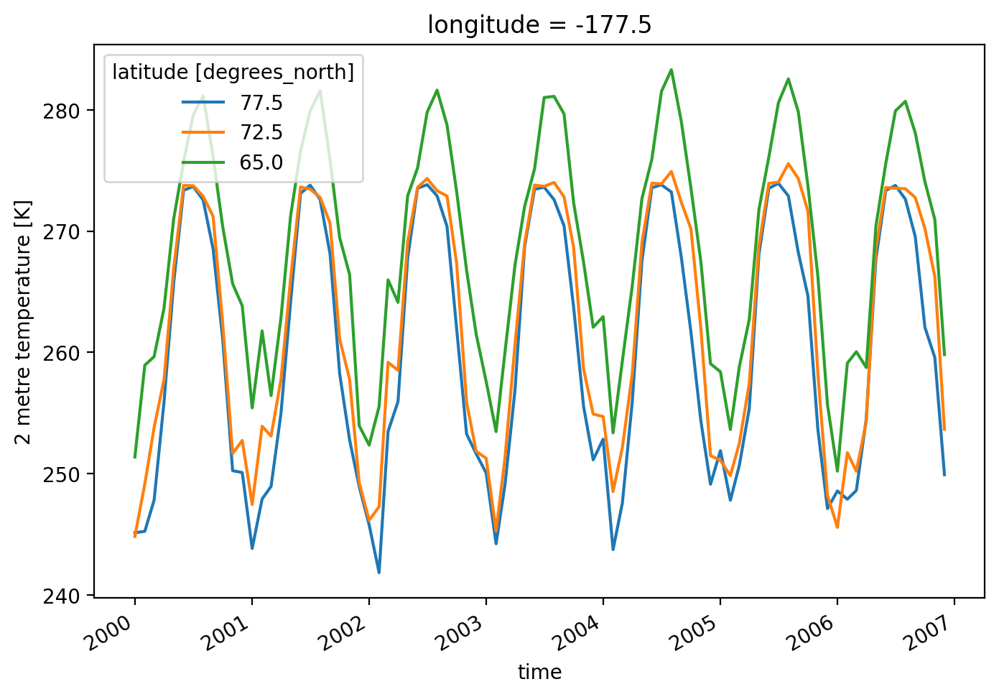

In [61]:
plt.figure(1, figsize=[8,5])
temp.t2m.sel({'time': slice('2000', '2006')}).isel(longitude=10, latitude=[50, 70, 100]).plot.line(x="time")

In [100]:
seasonal_mean = temp.t2m.groupby("time.season").mean()
seasonal_mean

<xarray.DataArray 't2m' (season: 4, latitude: 721, longitude: 1440)>
array([[[246.63531, 246.63531, 246.63531, ..., 246.63531, 246.63531,
         246.63531],
        [246.54356, 246.54324, 246.5429 , ..., 246.54463, 246.5443 ,
         246.54396],
        [246.49258, 246.49194, 246.4911 , ..., 246.49492, 246.49413,
         246.49336],
        ...,
        [241.01112, 241.01501, 241.01889, ..., 240.99956, 241.00345,
         241.00728],
        [241.32678, 241.32893, 241.33073, ..., 241.32109, 241.32304,
         241.32489],
        [241.55281, 241.55281, 241.55281, ..., 241.55281, 241.55281,
         241.55281]],

       [[273.38235, 273.38235, 273.38235, ..., 273.38235, 273.38235,
         273.38235],
        [273.37372, 273.3737 , 273.37366, ..., 273.37347, 273.37357,
         273.3736 ],
        [273.36996, 273.37006, 273.37018, ..., 273.36972, 273.3699 ,
         273.3699 ],
...
        [221.97836, 221.9818 , 221.9852 , ..., 221.96805, 221.97148,
         221.97499],
        [221.92917, 221.93082, 221.9325 , ..., 221.92412, 221.9259 ,
         221.9275 ],
        [222.18954, 222.18954, 222.18954, ..., 222.18954, 222.18954,
         222.18954]],

       [[258.26337, 258.26337, 258.26337, ..., 258.26337, 258.26337,
         258.26337],
        [258.22498, 258.22458, 258.22415, ..., 258.22632, 258.22595,
         258.2255 ],
        [258.23306, 258.23206, 258.2312 , ..., 258.23547, 258.23465,
         258.2339 ],
        ...,
        [226.52615, 226.52963, 226.53313, ..., 226.51569, 226.5191 ,
         226.52267],
        [226.66017, 226.66197, 226.66364, ..., 226.65492, 226.65665,
         226.65843],
        [226.95596, 226.95596, 226.95596, ..., 226.95596, 226.95596,
         226.95596]]], dtype=float32)
Coordinates:
  * longitude  (longitude) float32 -180.0 -179.8 -179.5 ... 179.2 179.5 179.8
  * latitude   (latitude) float32 90.0 89.75 89.5 89.25 ... -89.5 -89.75 -90.0
  * season     (season) object 'DJF' 'JJA' 'MAM' 'SON'
Attributes:
    units:      K
    long_name:  2 metre temperature

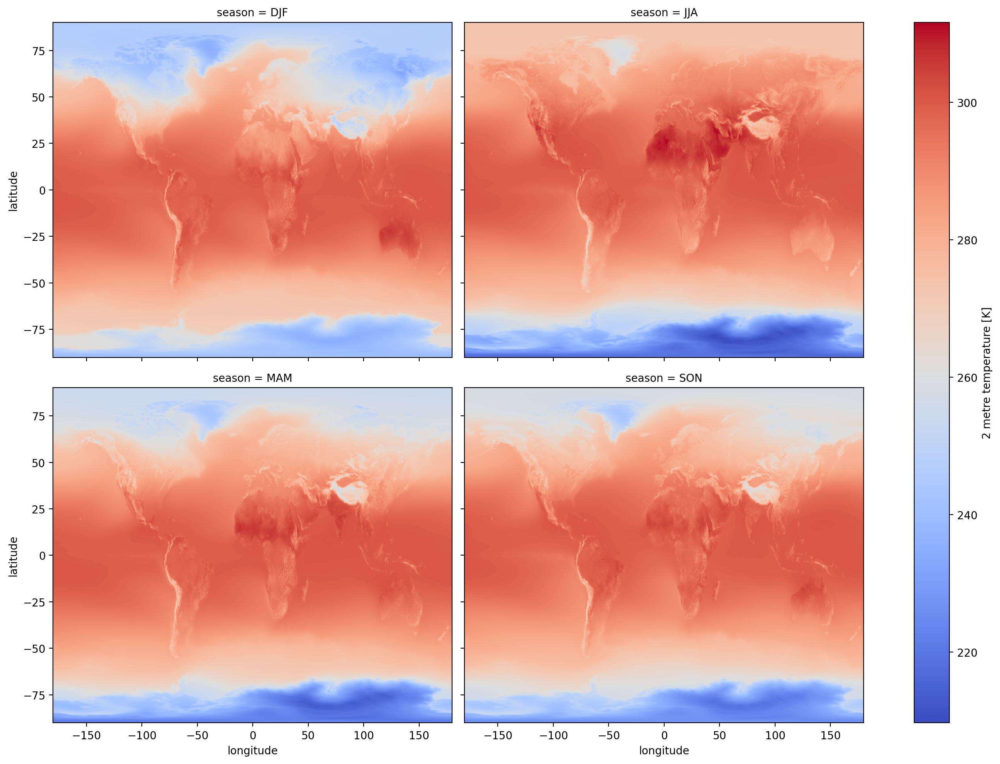

In [101]:
seasonal_mean.plot(col="season",
                   cmap = 'coolwarm',
                   aspect=1.3,
                   size=5, col_wrap=2)

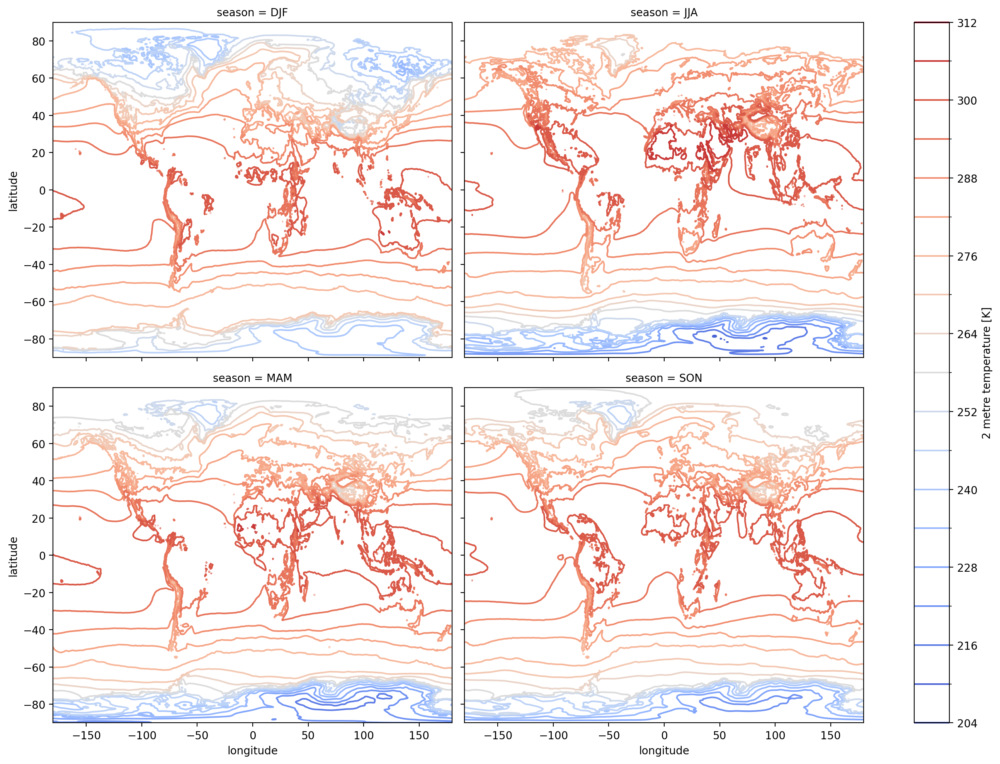

In [102]:
seasonal_mean.plot.contour(col="season", cmap = 'coolwarm',
                           levels=20, add_colorbar=True,
                           aspect=1.3, size=5, col_wrap=2)

### MPI-ESM1-2-LR (2015-2050)

Text(0.5, 1.0, 'Mean Surface Temperature MPI-ESM1-2-LR model 2015-2050')

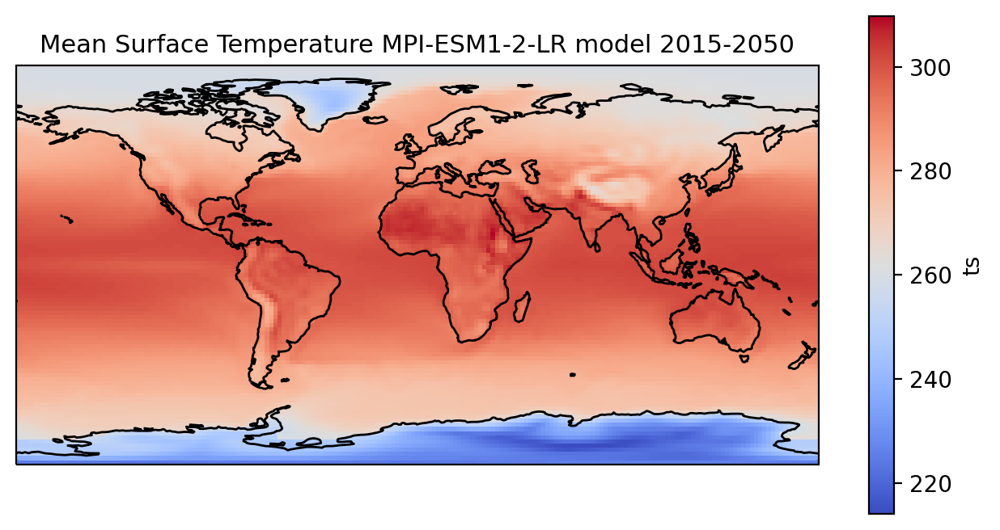

In [65]:
# Plot the mean values of scenario over time
fig = plt.figure(1, figsize=[8,4])

ax = plt.subplot(1, 1, 1, projection=ccrs.PlateCarree())
ax.coastlines()

model.ts.mean(dim='time').plot.pcolormesh(ax=ax, cmap='coolwarm')
plt.title("Mean Surface Temperature MPI-ESM1-2-LR model 2015-2050", fontsize=11)

I can directly notice the difference in resolution.

In [66]:
lat = model.ts.coords['lat'].values
lon = model.ts.coords['lon'].values
model_mean = model.ts.mean(dim='time')

In [67]:
ts_mean = pd.DataFrame(model_mean, lat, lon)

In [68]:
ts_mean

,-180.000,-178.125,-176.250,-174.375,-172.500,-170.625,-168.750,-166.875,-165.000,-163.125,...,161.250,163.125,165.000,166.875,168.750,170.625,172.500,174.375,176.250,178.125
88.572169,260.103149,260.099792,260.099487,260.097870,260.094086,260.093353,260.091583,260.091949,260.092010,260.089417,...,260.097229,260.097260,260.095276,260.113922,260.108826,260.110382,260.109985,260.108124,260.107147,260.103516
86.722531,259.741211,259.730194,259.713104,259.699188,259.690857,259.679016,259.664429,259.646210,259.633331,259.620728,...,259.908203,259.890289,259.877747,259.858429,259.843109,259.823120,259.806763,259.789093,259.769470,259.759064
84.861970,259.824249,259.796143,259.773468,259.753876,259.732086,259.705200,259.674835,259.647095,259.621796,259.597931,...,259.992432,259.977112,259.961060,259.938263,259.928192,259.912476,259.893311,259.876160,259.858551,259.844818
82.998942,259.946472,259.917633,259.896301,259.873474,259.847321,259.822021,259.790009,259.749023,259.719299,259.694672,...,260.088989,260.073181,260.061249,260.039093,260.032623,260.020172,260.006195,259.995148,259.983154,259.964142
81.134977,260.090454,260.078003,260.058838,260.040894,260.016876,259.989685,259.959442,259.925446,259.890015,259.853088,...,260.189880,260.170654,260.161133,260.154022,260.151031,260.141541,260.128113,260.125061,260.115448,260.110138
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
-81.134977,248.326477,248.194077,248.154984,248.168869,248.186539,248.198257,248.215897,248.234070,248.263855,248.307037,...,244.064560,245.637085,246.972427,248.030731,248.797241,249.255966,249.400223,249.267288,248.957977,248.600525
-82.998942,250.572098,250.398438,250.187897,250.015076,249.828400,249.626816,249.434219,249.227509,249.014145,248.828537,...,245.761887,247.000717,248.087006,249.007034,249.731476,250.267761,250.602463,250.784958,250.806381,250.726089
-84.861970,248.406952,248.755264,249.018417,249.211288,249.361786,249.457336,249.507828,249.527969,249.522736,249.483780,...,240.669113,241.760925,242.806900,243.785812,244.690903,245.511551,246.255020,246.913254,247.485382,247.987900
-86.722531,236.855469,237.310089,237.715744,238.100510,238.449768,238.743454,239.019623,239.261536,239.457214,239.623947,...,230.999786,231.671585,232.343323,232.993622,233.605728,234.205673,234.777603,235.338211,235.870743,236.379333


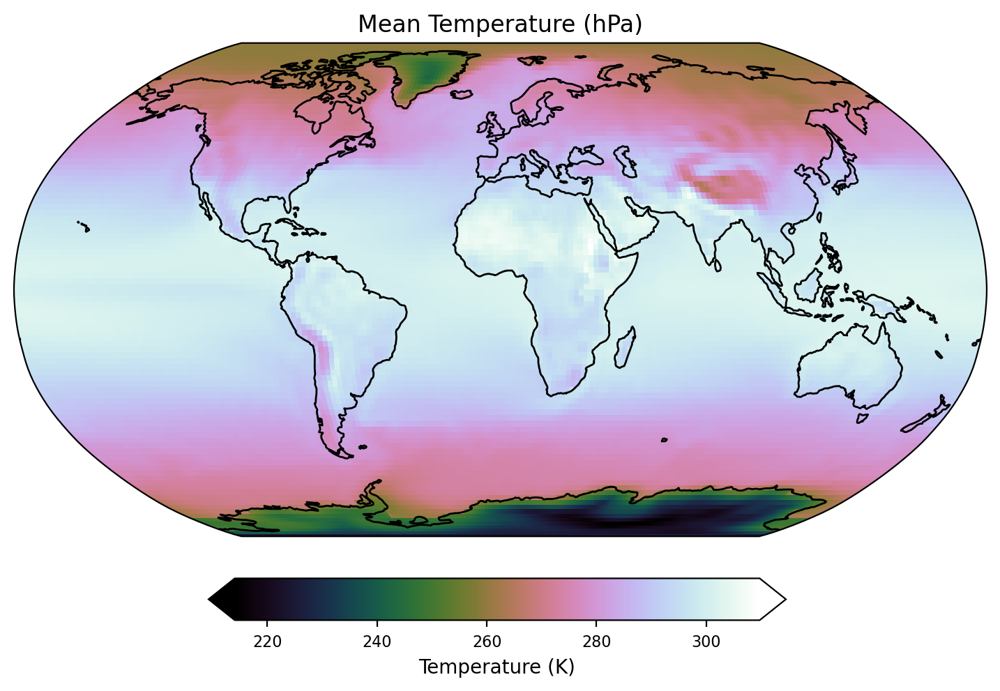

In [69]:
fig = plt.figure(figsize=(9,6))  # x,y(inches)

ax = plt.axes(projection=ccrs.Robinson())
ax.set_global()
ax.set_title('Mean Temperature (hPa)')

mm = ax.pcolormesh(ts_mean.columns, # longitude
                   ts_mean.index, # latitude
                   ts_mean, # data
                   shading='auto', \
                   transform=ccrs.PlateCarree(),
                   cmap=mpl.cm.cubehelix )

ax.coastlines()

#- add colorbar
cbar_ax = fig.add_axes([0.28, 0.10, 0.46, 0.05]) #[left, bottom, width, height]
cbar = fig.colorbar(mm, cax=cbar_ax, extend='both', orientation='horizontal')
cbar.set_label('Temperature (K)') #($\mu g$ $m^{-3}$)
cbar.ax.tick_params(labelsize=8)

plt.show()
plt.close()

In [72]:
model

<xarray.Dataset>
Dimensions:    (time: 432, bnds: 2, lat: 96, lon: 192)
Coordinates:
  * time       (time) datetime64[ns] 2015-01-16T12:00:00 ... 2050-12-16T12:00:00
  * lat        (lat) float64 88.57 86.72 84.86 83.0 ... -84.86 -86.72 -88.57
  * lon        (lon) float64 -180.0 -178.1 -176.2 -174.4 ... 174.4 176.2 178.1
Dimensions without coordinates: bnds
Data variables:
    time_bnds  (time, bnds) datetime64[ns] ...
    lat_bnds   (time, lat, bnds) float64 ...
    lon_bnds   (time, lon, bnds) float64 179.1 -179.1 -179.1 ... 177.2 179.1
    ts         (time, lat, lon) float32 251.7 251.6 251.6 ... 239.4 239.5 239.4
Attributes: (12/47)
    Conventions:            CF-1.7 CMIP-6.2
    activity_id:            ScenarioMIP
    branch_method:          standard
    branch_time_in_child:   60265.0
    branch_time_in_parent:  60265.0
    contact:                cmip6-mpi-esm@dkrz.de
    ...                     ...
    title:                  MPI-ESM1-2-LR output prepared for CMIP6
    variable_id:            ts
    variant_label:          r1i1p1f1
    license:                CMIP6 model data produced by MPI-M is licensed un...
    cmor_version:           3.5.0
    tracking_id:            hdl:21.14100/47b33dbd-7fcd-4f09-abcf-25202400ba8c

In [81]:
model.time[2].values

numpy.datetime64('2015-03-16T12:00:00.000000000')

Text(0, 0.5, 'K')

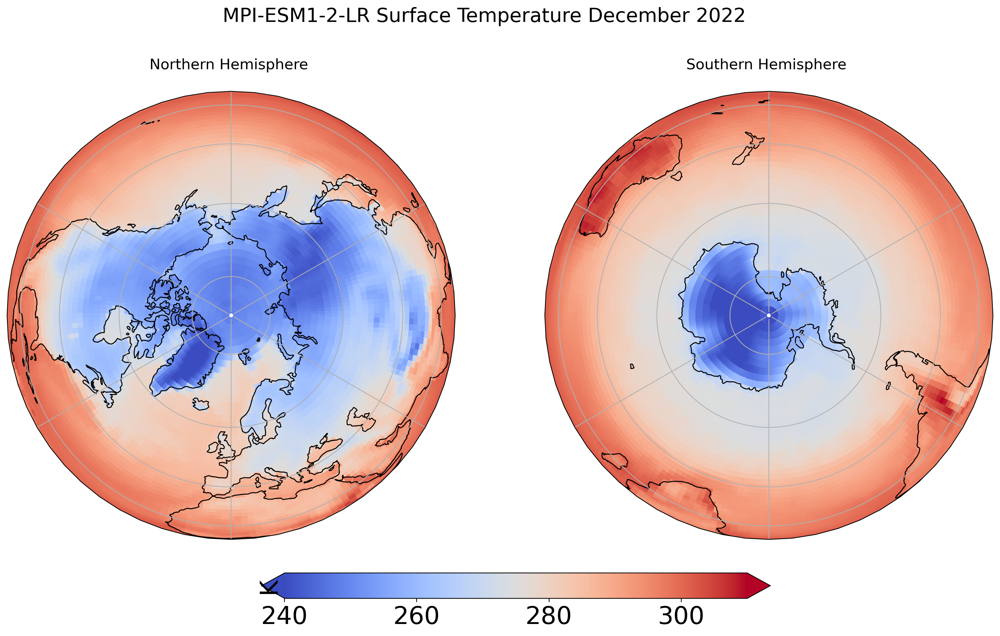

In [87]:
# Combine plot with different projections
fig = plt.figure(1, figsize=[18,9])

# Fix extent
minval = 240
maxval = 310

# Plot 1 for Northern Hemisphere subplot argument (nrows, ncols, nplot)
# here 1 row, 2 columns and 1st plot
ax1 = plt.subplot(1, 2, 1, projection=ccrs.Orthographic(0, 90))

# Plot 2 for Southern Hemisphere
# 2nd plot 
ax2 = plt.subplot(1, 2, 2, projection=ccrs.Orthographic(180, -90))

tsel = 0
for ax,t in zip([ax1, ax2], ["Northern", "Southern"]):
    map = model.ts.sel(time='2022-12-16T12:00:00.000000000').plot(ax=ax, vmin=minval, vmax=maxval, 
                                                             transform=ccrs.PlateCarree(), 
                                                             cmap='coolwarm', 
                                                             add_colorbar=False)
    ax.set_title(t + " Hemisphere \n" , fontsize=15)
    ax.coastlines()
    ax.gridlines()

# Title for both plots
fig.suptitle('MPI-ESM1-2-LR Surface Temperature December 2022', fontsize=20)


cb_ax = fig.add_axes([0.325, 0.05, 0.4, 0.04])

cbar = plt.colorbar(map, cax=cb_ax, extend='both', orientation='horizontal', fraction=0.046, pad=0.04)
cbar.ax.tick_params(labelsize=25)
cbar.ax.set_ylabel('K', fontsize=25)

Text(0.5, 1.0, 'Mean Temperature (K) from 2020 to 2030')

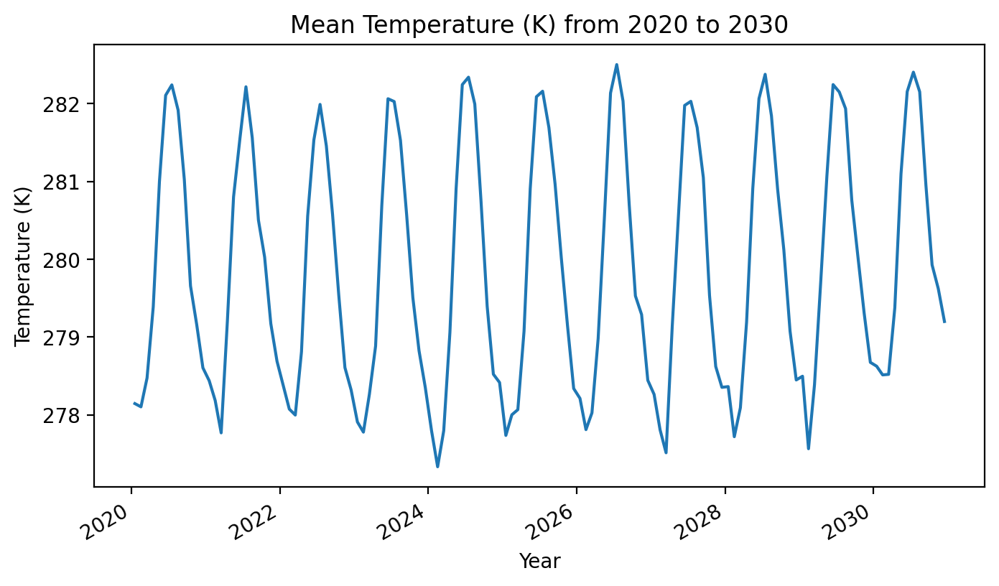

In [96]:
# Plot the mean values of the scenario over longitude and latitude
model.mean(['lat', 'lon']).ts.sel({'time': slice('2020', '2030')}).plot()
plt.xlabel('Year')
plt.ylabel('Temperature (K)')
plt.title('Mean Temperature (K) from 2020 to 2030')

Text(0.5, 1.0, 'Mean Temperature (K) from 2020 to 2030 per Emisphere')

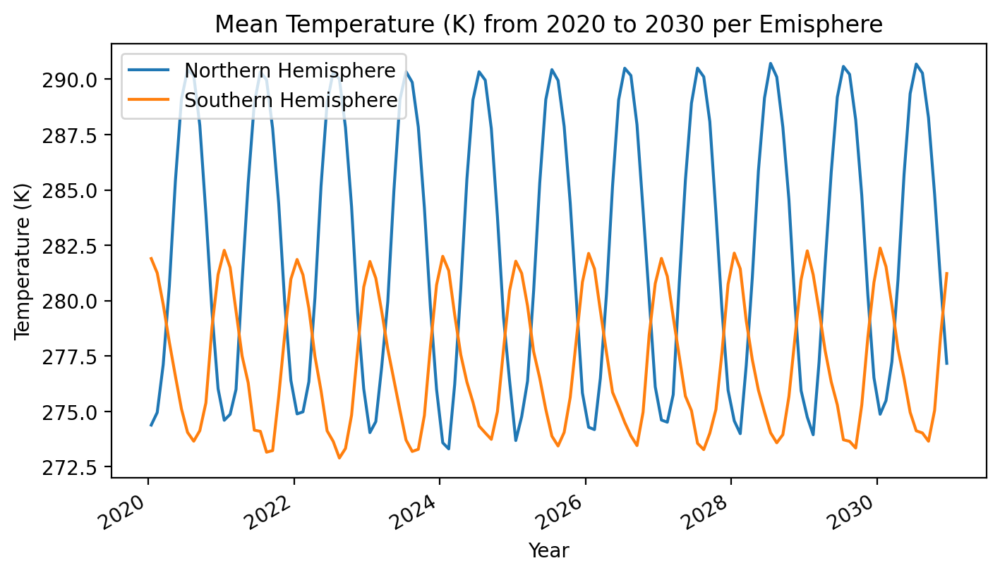

In [95]:
# Plot the mean values of the scenario over longitude and latitude (separating the emispheres)
model.where(model.lat > 0).sel({'time': slice('2020', '2030')}).mean(['lat', 'lon']).ts.plot(label='Northern Hemisphere')
model.where(model.lat < 0).sel({'time': slice('2020', '2030')}).mean(['lat', 'lon']).ts.plot(label='Southern Hemisphere')
plt.xlabel('Year')
plt.ylabel('Temperature (K)')
plt.legend()
plt.title('Mean Temperature (K) from 2020 to 2030 per Emisphere')

Text(0.5, 1.0, 'Mean Temperature (K) from 2025 to 2030 over Longitude')

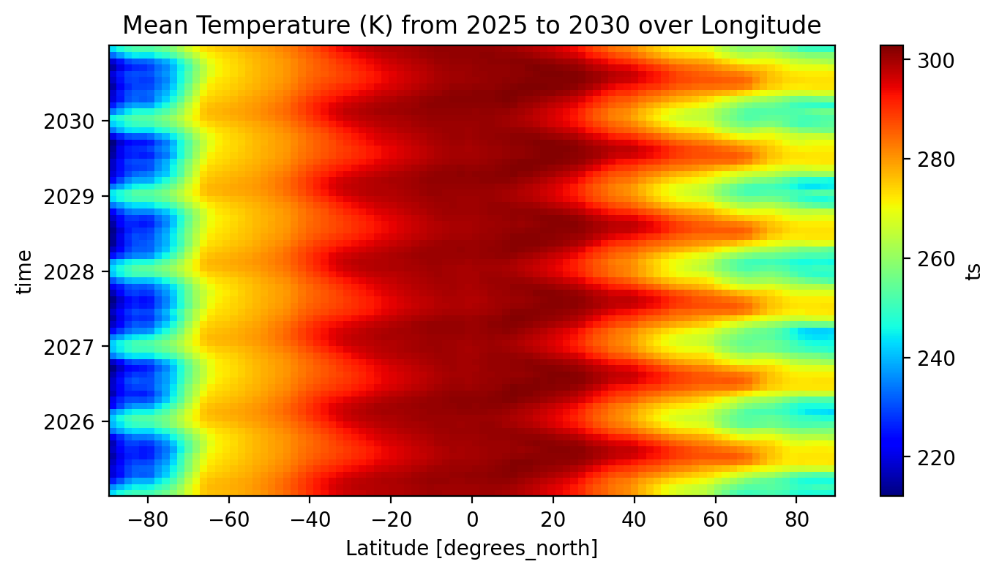

In [94]:
# Plot the mean values of the scenario over longitude
model.sel({'time': slice('2025', '2030')}).ts.mean(dim='lon').plot(cmap='jet')
plt.title('Mean Temperature (K) from 2025 to 2030 over Longitude')

In [97]:
# Compute the average yearly temperature 
# first mean of all year, mean between all years, and mean on lat lon
annual_mean_temperature = model.ts.resample(time='Y', label='right').mean(dim='time').mean(dim='time').mean().values
print('The Annual Mean Temperature between 2015 and 2050 is:', annual_mean_temperature)


The Annual Mean Temperature between 2015 and 2050 is: 279.9384


In [98]:
seasonal_mean = model.ts.groupby("time.season").mean()
seasonal_mean

<xarray.DataArray 'ts' (season: 4, lat: 96, lon: 192)>
array([[[248.87894, 248.87198, 248.86989, ..., 248.89072, 248.88844,
         248.88123],
        [248.07092, 248.04707, 248.01292, ..., 248.15842, 248.11932,
         248.0947 ],
        [247.90872, 247.85469, 247.82776, ..., 248.01189, 247.96515,
         247.94545],
        ...,
        [257.3325 , 257.80054, 258.19406, ..., 255.68124, 256.2763 ,
         256.82108],
        [247.97238, 248.33287, 248.65443, ..., 246.82402, 247.2071 ,
         247.61543],
        [240.62566, 240.55457, 240.48662, ..., 240.8471 , 240.7822 ,
         240.70201]],

       [[272.3684 , 272.36765, 272.36838, ..., 272.3676 , 272.36774,
         272.368  ],
        [272.2623 , 272.2638 , 272.26178, ..., 272.26453, 272.26425,
         272.2638 ],
        [272.28043, 272.2813 , 272.27884, ..., 272.281  , 272.28177,
         272.2816 ],
...
        [247.24951, 247.65834, 247.96422, ..., 245.59352, 246.21046,
         246.78401],
        [234.71307, 235.23962, 235.72263, ..., 232.98836, 233.601  ,
         234.16745],
        [221.24445, 221.1628 , 221.07278, ..., 221.5279 , 221.4447 ,
         221.34277]],

       [[262.89508, 262.89426, 262.89685, ..., 262.89224, 262.89383,
         262.89386],
        [262.50146, 262.49057, 262.47885, ..., 262.53265, 262.51883,
         262.52063],
        [262.74728, 262.71243, 262.66528, ..., 262.8038 , 262.7867 ,
         262.77185],
        ...,
        [246.47685, 246.75137, 246.95355, ..., 245.09572, 245.64685,
         246.11057],
        [235.14192, 235.58359, 235.98395, ..., 233.61662, 234.15804,
         234.65663],
        [223.24113, 223.19824, 223.15482, ..., 223.35623, 223.3241 ,
         223.28383]]], dtype=float32)
Coordinates:
  * lat      (lat) float64 88.57 86.72 84.86 83.0 ... -83.0 -84.86 -86.72 -88.57
  * lon      (lon) float64 -180.0 -178.1 -176.2 -174.4 ... 174.4 176.2 178.1
  * season   (season) object 'DJF' 'JJA' 'MAM' 'SON'
Attributes:
    standard_name:  surface_temperature
    long_name:      Surface Temperature
    comment:        Temperature of the lower boundary of the atmosphere
    units:          K
    cell_methods:   area: time: mean
    cell_measures:  area: areacella
    history:        2019-10-29T16:19:11Z altered by CMOR: replaced missing va...

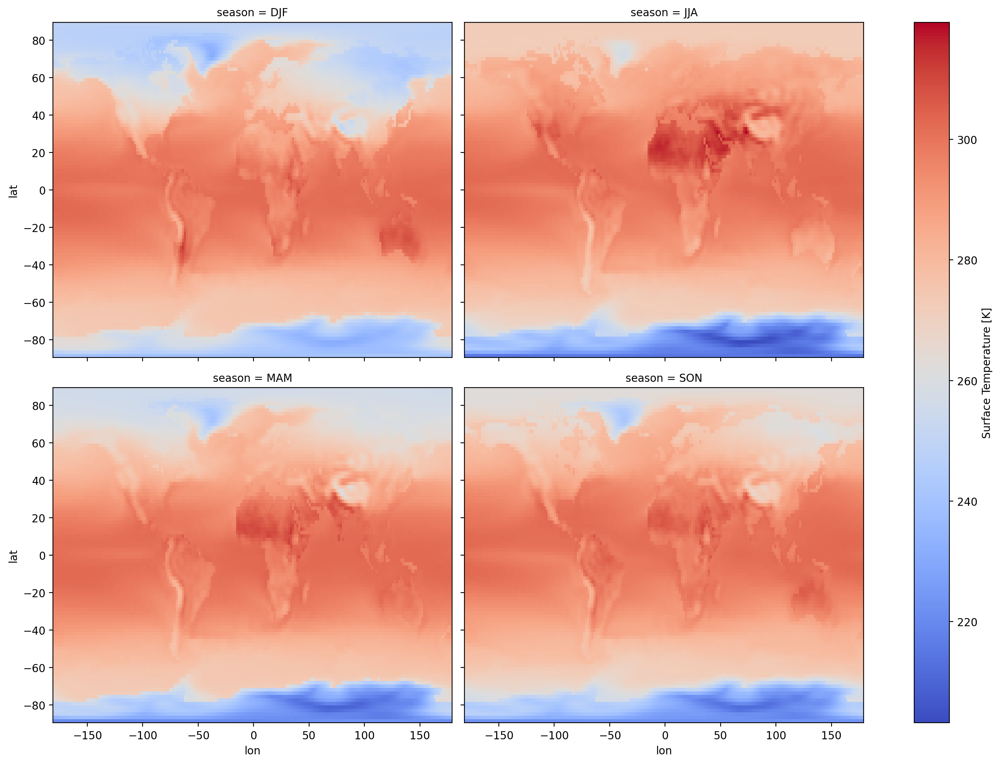

In [99]:
seasonal_mean.plot(col="season",
                   cmap = 'coolwarm',
                   aspect=1.3,
                   size=5, col_wrap=2)

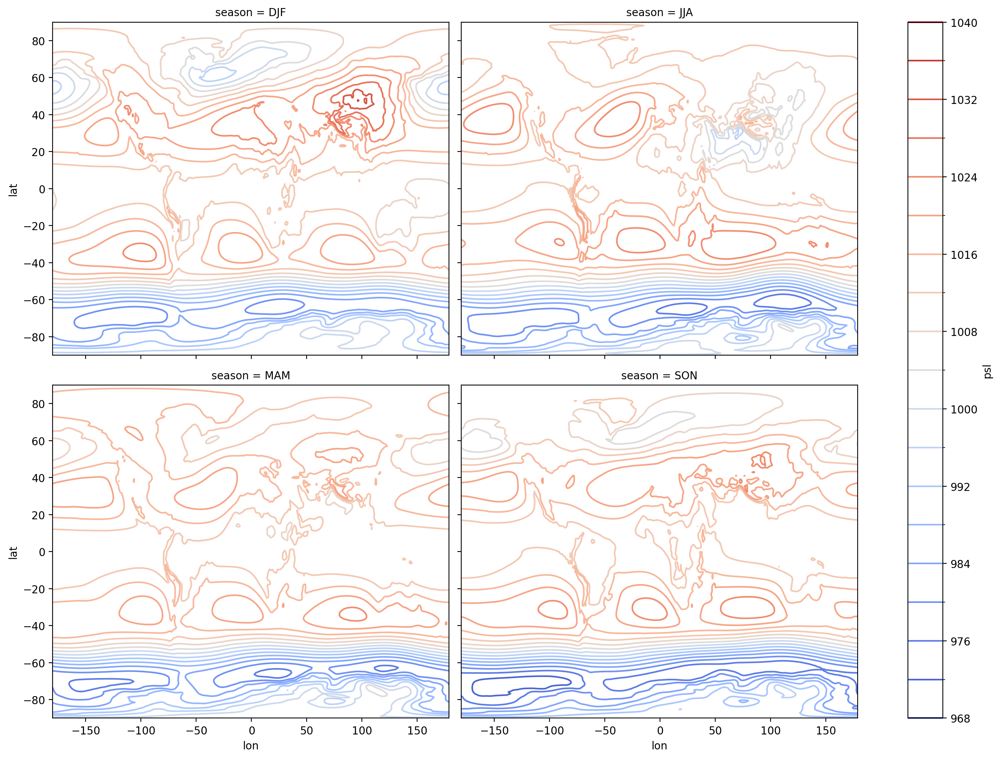

In [47]:
seasonal_mean.plot.contour(col="season", cmap = 'coolwarm',
                           levels=20, add_colorbar=True,
                           aspect=1.3, size=5, col_wrap=2)

## Spatial Aggregation: Regridding

print('GPCC dataset shape:\t', gpcc_month.dims['lat'], gpcc_month.dims['lon'])
print('Earth3 dataset shape:\t', earth3_best.dims['lat'], earth3_best.dims['lon'])

In [108]:
print('ERA5 dataset shape:\t\t', temp.dims['latitude'], temp.dims['longitude'])
print('MPI-ESM1-2-LR dataset shape:\t', model.dims['lat'], model.dims['lon'])

ERA5 dataset shape:		 721 1440
MPI-ESM1-2-LR dataset shape:	 96 192


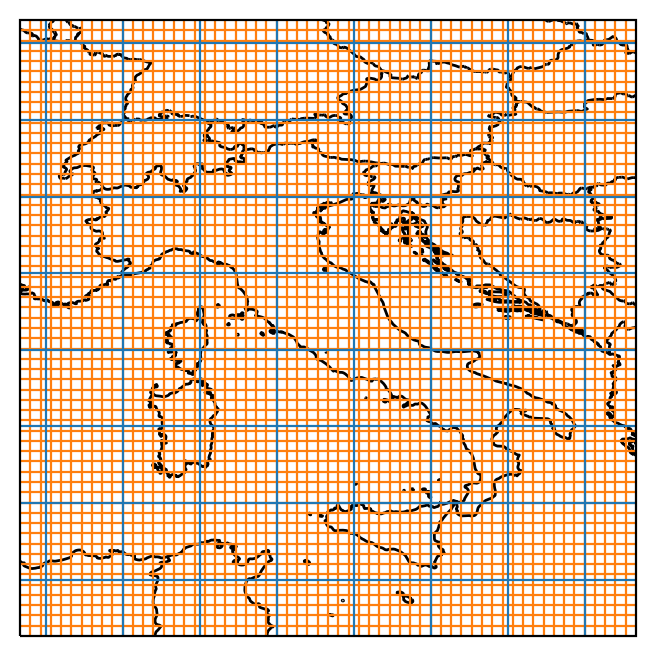

In [109]:
# Plot grid comparison over Italy
ax = plt.axes(projection=ccrs.PlateCarree())
ax.set_extent([5, 20, 35, 50]) # select italy
ax.coastlines()
ax.add_feature(cf.BORDERS)

gl1 = ax.gridlines(color='tab:orange') # gpcc grid
gl1.xlocator = ticker.FixedLocator(temp.longitude.values)
gl1.ylocator = ticker.FixedLocator(temp.latitude.values)

gl2 = ax.gridlines(color='tab:blue') # cmip6 grid
gl2.xlocator = ticker.FixedLocator(model.lon.values)
gl2.ylocator = ticker.FixedLocator(model.lat.values)

In [110]:
temp_lin = temp.interp(latitude=model.lat, longitude=model.lon, method='linear')
temp_near = temp.interp(latitude=model.lat, longitude=model.lon, method='nearest')

In [113]:
# Check which one preserves the global mean precipitation
print('Original average mslp:\t', temp.t2m.mean(['time', 'latitude', 'longitude']).values)
print('Linear average mslp:\t', temp_lin.t2m.mean(['time', 'lat', 'lon']).values)
print('Nearest average mslp.:\t', temp_near.t2m.mean(['time', 'lat', 'lon']).values)

Original average mslp:	 278.19754
Linear average mslp:	 278.4317843603806
Nearest average mslp.:	 278.4387


#### Keep only the common cells

## MSLP Normals

The climate normals serve as a benchmark against which recent or current observations can be compared, including providing a basis for many anomaly based climate datasets. The period from 1961 to 1990 has been retained as a standard reference period for long-term climate change assessments (WMO Guidelines on the Calculation of Climate Normals - 2017 edition)

Keep only the cells in common between ERA5 and CESMP2 dataset. 

In [114]:
# Total and used cells after regridding
temp = np.isnan(temp_lin.t2m.values[0])
print('Used cells:', np.sum(temp == False))

Used cells: 18432


In [125]:
# Mask in CESMP2 datasets only the used cells in ERA5 dataset
model = model.assign(psl_masked = model.psl.where(temp == False))

In [126]:
model

<xarray.Dataset>
Dimensions:     (time: 432, lat: 192, lon: 288, nbnd: 2)
Coordinates:
  * lat         (lat) float64 90.0 89.06 88.12 87.17 ... -88.12 -89.06 -90.0
  * lon         (lon) float64 -180.0 -178.8 -177.5 -176.2 ... 176.2 177.5 178.8
  * time        (time) object 2015-01-15 12:00:00 ... 2050-12-15 12:00:00
Dimensions without coordinates: nbnd
Data variables:
    psl         (time, lat, lon) float32 1.006e+03 1.006e+03 ... 995.9 995.9
    time_bnds   (time, nbnd) object ...
    lat_bnds    (lat, nbnd) float64 ...
    lon_bnds    (lon, nbnd) float64 179.4 -179.4 -179.4 ... 178.1 178.1 179.4
    pr_masked   (time, lat, lon) float32 1.006e+03 1.006e+03 ... 995.9 995.9
    psl_masked  (time, lat, lon) float32 1.006e+03 1.006e+03 ... 995.9 995.9
Attributes: (12/45)
    Conventions:            CF-1.7 CMIP-6.2
    activity_id:            ScenarioMIP
    branch_method:          standard
    branch_time_in_child:   735110.0
    branch_time_in_parent:  735110.0
    case_id:                1729
    ...                     ...
    sub_experiment_id:      none
    table_id:               Amon
    tracking_id:            hdl:21.14100/5aa6c2c5-f0ab-4317-87f1-58521102355f
    variable_id:            psl
    variant_info:           CMIP6 SSP1-2.6 experiments (2015-2100) with CAM6,...
    variant_label:          r4i1p1f1

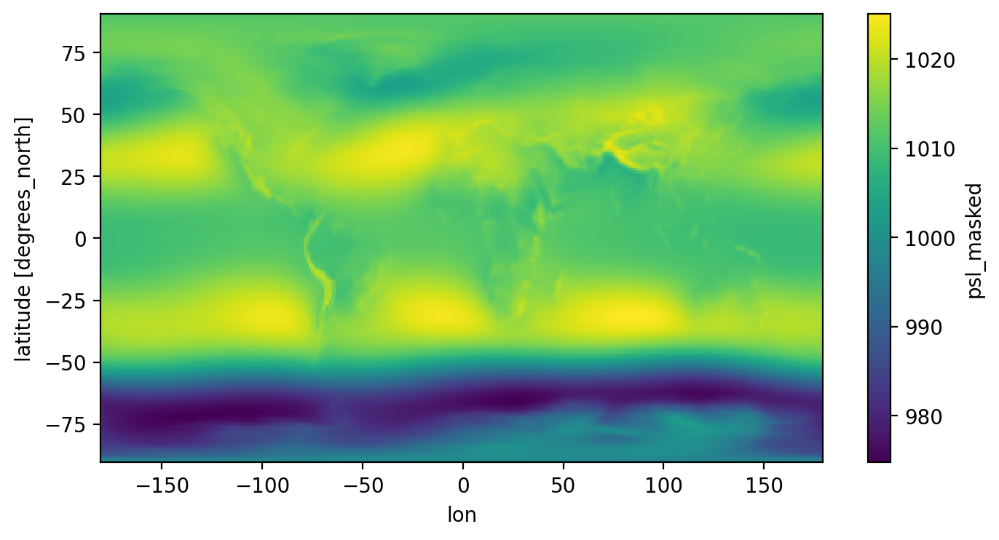

In [127]:
# Plot the new masked variable
model.psl_masked.mean('time').plot()

In [115]:
# Define reference period
yref0 = 1961
yref1 = 1990

In [116]:
# Compute normals on GPCC dataset
normals = mslp_monthly_near.sel({'time': slice(str(yref0), str(yref1))}).groupby('time.month').mean()
normals

<xarray.Dataset>
Dimensions:         (month: 12, lat: 192, lon: 288)
Coordinates:
    expver          int32 1
    latitude        (lat) float64 90.0 89.06 88.12 87.17 ... -88.12 -89.06 -90.0
    longitude       (lon) float64 -180.0 -178.8 -177.5 ... 176.2 177.5 178.8
  * lat             (lat) float64 90.0 89.06 88.12 87.17 ... -88.12 -89.06 -90.0
  * lon             (lon) float64 -180.0 -178.8 -177.5 ... 176.2 177.5 178.8
  * month           (month) int64 1 2 3 4 5 6 7 8 9 10 11 12
Data variables:
    msl             (month, lat, lon) float32 1.016e+03 1.016e+03 ... 1.006e+03
    longitude_bnds  (month, lon) float32 -180.0 -178.8 -177.5 ... 177.5 178.8
Attributes:
    Conventions:  CF-1.6
    history:      2023-12-01 14:53:42 GMT by grib_to_netcdf-2.25.1: /opt/ecmw...

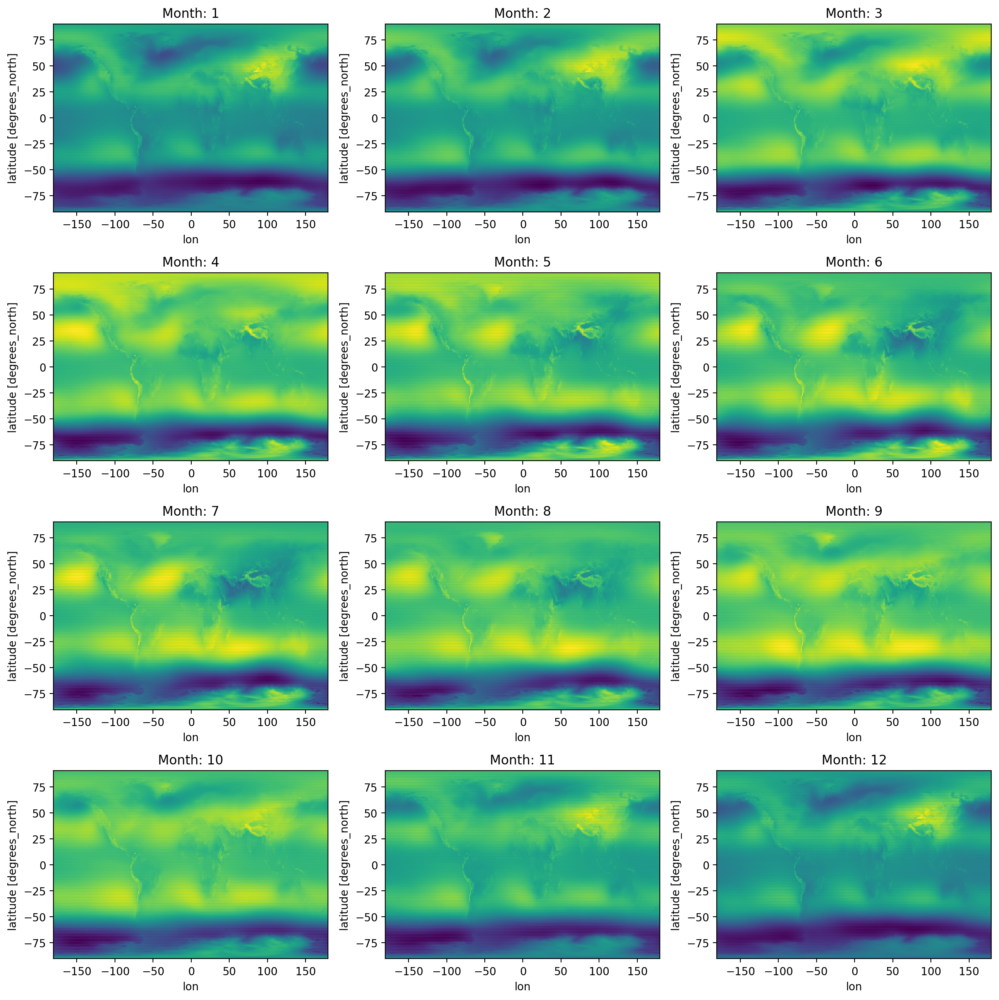

In [117]:
# Plot the normals for every month
month = 1
f, ax = plt.subplots(4, 3, figsize=(13, 13))

for i in ax:
    for j in i:
        normals.sel({'month': month}).msl.plot(ax=j, add_colorbar=False)
        j.set_title(f"Month: {month}")
        month += 1

plt.tight_layout()

## Monthly Anomalies

In [128]:
# Compute GPCC and Earth3 anomalies
mslp_monthly_near['anomalies'] = (mslp_monthly_near.groupby('time.month') - normals).msl
model['anomalies'] = (model.psl_masked.groupby('time.month') - normals.msl)

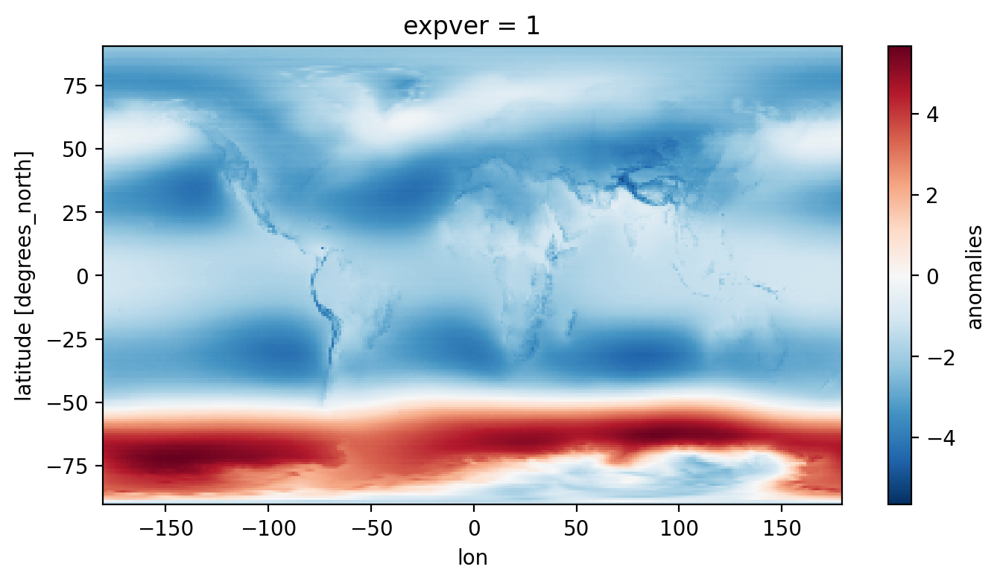

In [129]:
# Plot GPCC anomalies
mslp_monthly_near['anomalies'].mean('time').plot()

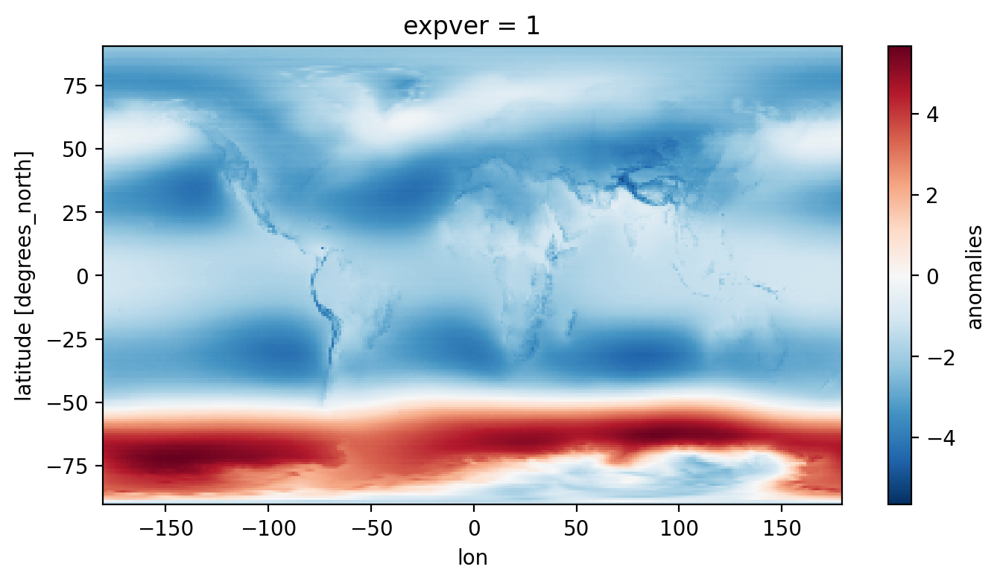

In [130]:
# Plot GPCC anomalies
mslp_monthly_near['anomalies'].mean('time').plot()

Text(0, 0.5, 'MSLP anomalies (mm/day)')

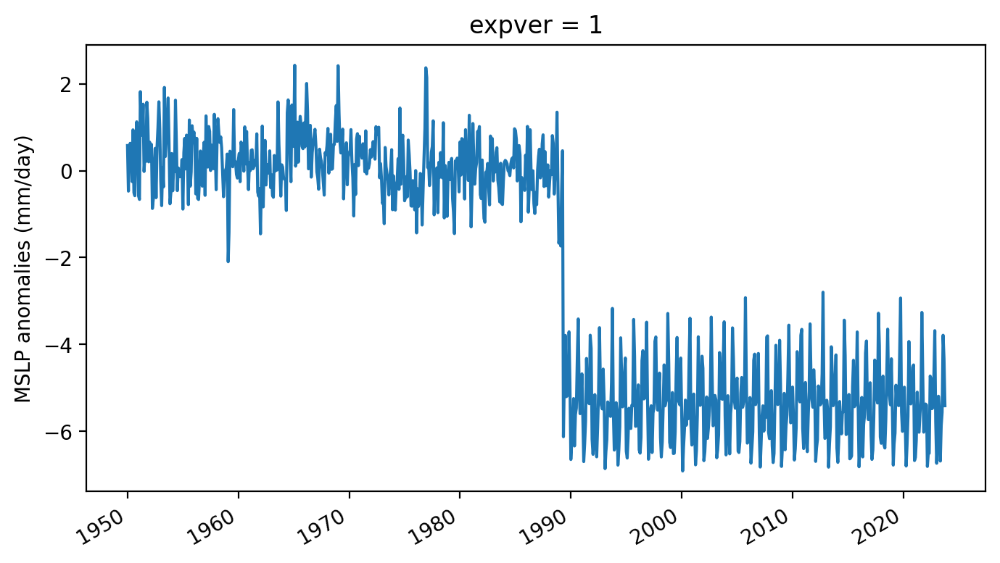

In [131]:
# Plot the gpcc anomalies
mslp_monthly_near.mean(['lat', 'lon']).anomalies.plot()
plt.xlabel('')
plt.ylabel('MSLP anomalies (mm/day)')

Text(0, 0.5, 'Magnitude')

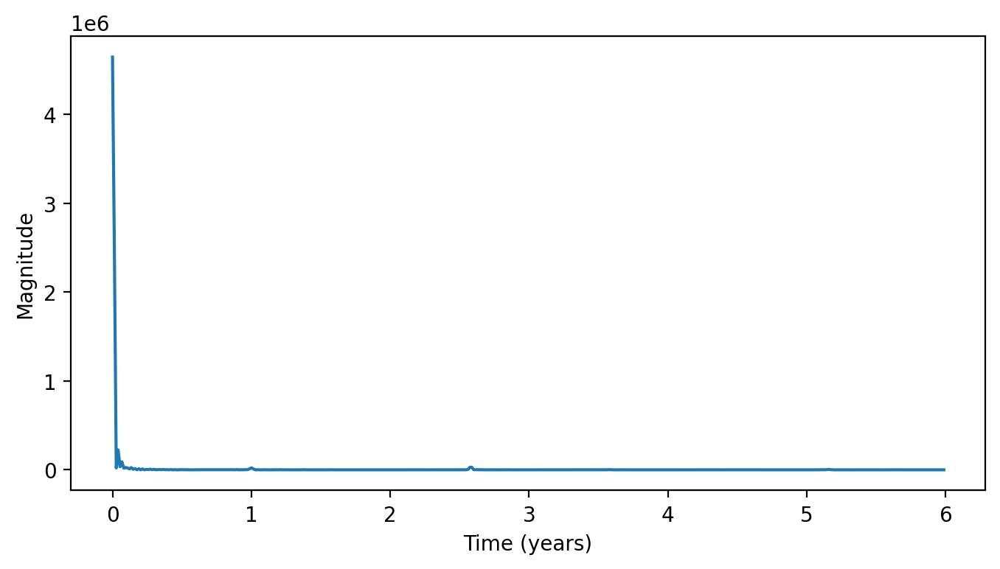

In [132]:
# Plot the spectral analysis of the time series for gpcc
data = mslp_monthly_near.mean(['lat', 'lon']).anomalies.values
ps = np.abs(np.fft.fft(data)) ** 2

time_step = 1.0/12
freqs = np.fft.fftfreq(data.size, time_step)
idx = np.argsort(freqs)
idx = idx[(len(idx)//2):]

plt.plot(freqs[idx], ps[idx])
plt.xlabel('Time (years)')
plt.ylabel('Magnitude')


## Arithmetic vs weighted mean

In [133]:
# Compute weights based on latitude
weights = np.cos(np.deg2rad(mslp_monthly_near.lat))

# Create Weighted Dataset
mslp_monthly_near_w = mslp_monthly_near.weighted(weights)

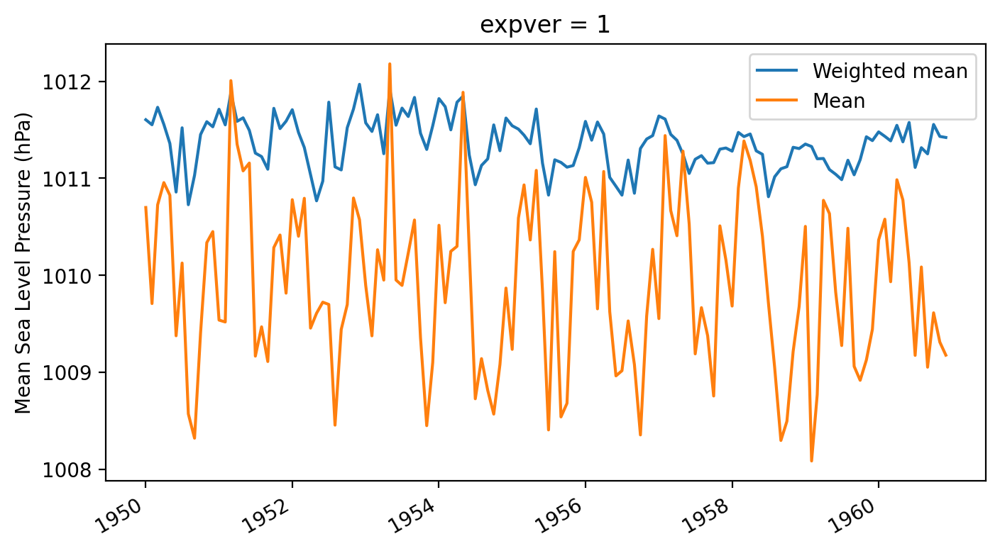

In [134]:
# Plot arithmetic vs weighted mean on precipitations
mslp_monthly_near_w.mean(['lat', 'lon']).sel({'time': slice('1950', '1960')}).msl.plot(label = 'Weighted mean')
mslp_monthly_near.mean(['lat', 'lon']).sel({'time': slice('1950', '1960')}).msl.plot(label = 'Mean')
plt.xlabel('')
plt.ylabel('Mean Sea Level Pressure (hPa)')
plt.legend()

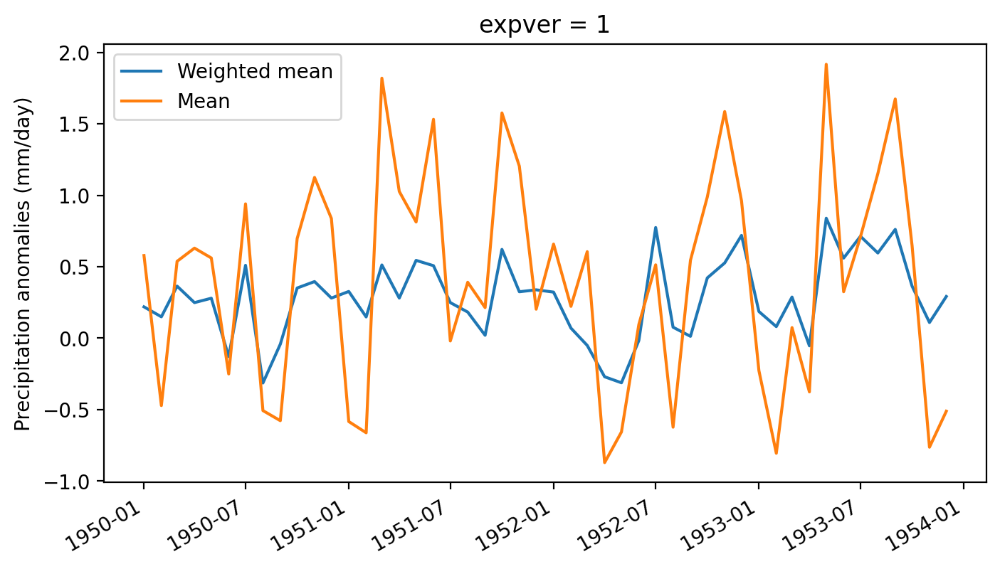

In [135]:
# Plot arithmetic vs weighted mean on anomalies
mslp_monthly_near_w.mean(["lon", "lat"]).sel({'time': slice('1950', '1953')}).anomalies.plot(label = 'Weighted mean')
mslp_monthly_near.mean(['lat', 'lon']).sel({'time': slice('1950', '1953')}).anomalies.plot(label = 'Mean')
plt.xlabel('')
plt.ylabel('Precipitation anomalies (mm/day)')
plt.legend()

There are great differences in values between the arithmetic and weighted mean regarding the mean sea level pressure. Although the differences are smaller in terms of anomalies let's use the weighted one when an average along the latitude axis is performed.

## Compare the common period

Let's compare the period from 2015 and 2020 which is the only in common between the two datasets. This check is necessary because the mean sea level pressure normals are going to be calculated only on the ERA5 dataset and used also for the models.

In [154]:
# Extract the dates of the common period
end = mslp_monthly.sel(expver=1).time.values[-1]
start = model.time.values[0]

In [155]:
model.time.values[0], mslp_monthly.sel(expver=1).time.values[-1]

(numpy.datetime64('2015-01-15T12:00:00.000000000'),
 numpy.datetime64('2023-10-01T00:00:00.000000000'))

### Mean Sea Level Pressure

In [160]:
model

<xarray.Dataset>
Dimensions:     (time: 432, lat: 192, lon: 288, nbnd: 2)
Coordinates:
  * lat         (lat) float64 90.0 89.06 88.12 87.17 ... -88.12 -89.06 -90.0
  * lon         (lon) float64 -180.0 -178.8 -177.5 -176.2 ... 176.2 177.5 178.8
  * time        (time) datetime64[ns] 2015-01-15T12:00:00 ... 2050-12-15T12:0...
    expver      (time) int32 1 1 1 1 1 1 1 1 1 1 1 1 ... 1 1 1 1 1 1 1 1 1 1 1 1
    latitude    (lat) float64 90.0 89.06 88.12 87.17 ... -88.12 -89.06 -90.0
    longitude   (lon) float64 -180.0 -178.8 -177.5 -176.2 ... 176.2 177.5 178.8
    month       (time) int64 1 2 3 4 5 6 7 8 9 10 11 ... 3 4 5 6 7 8 9 10 11 12
Dimensions without coordinates: nbnd
Data variables:
    psl         (time, lat, lon) float32 1.006e+03 1.006e+03 ... 995.9 995.9
    time_bnds   (time, nbnd) object ...
    lat_bnds    (lat, nbnd) float64 ...
    lon_bnds    (lon, nbnd) float64 179.4 -179.4 -179.4 ... 178.1 178.1 179.4
    pr_masked   (time, lat, lon) float32 1.006e+03 1.006e+03 ... 995.9 995.9
    psl_masked  (time, lat, lon) float32 1.006e+03 1.006e+03 ... 995.9 995.9
    anomalies   (time, lat, lon) float32 -9.7 -9.7 -9.7 ... -9.587 -9.587 -9.587
Attributes: (12/45)
    Conventions:            CF-1.7 CMIP-6.2
    activity_id:            ScenarioMIP
    branch_method:          standard
    branch_time_in_child:   735110.0
    branch_time_in_parent:  735110.0
    case_id:                1729
    ...                     ...
    sub_experiment_id:      none
    table_id:               Amon
    tracking_id:            hdl:21.14100/5aa6c2c5-f0ab-4317-87f1-58521102355f
    variable_id:            psl
    variant_info:           CMIP6 SSP1-2.6 experiments (2015-2100) with CAM6,...
    variant_label:          r4i1p1f1

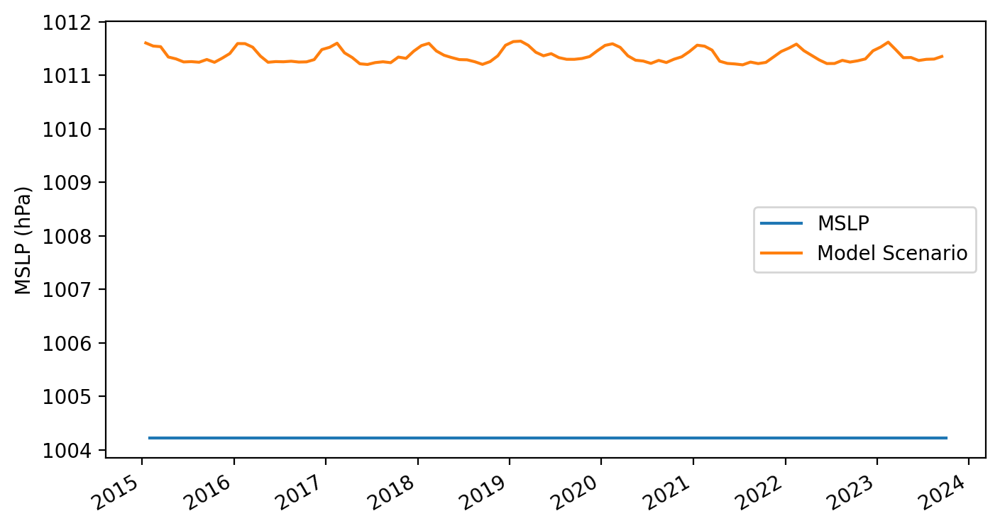

In [161]:
# Compute the Dataset weighted
mslp_monthly_w = mslp_monthly_near.weighted(weights)
model_w = model[['psl_masked']].weighted(weights)

# Plot the time series comparison
mslp_monthly_w.mean(['lat', 'lon']).sel({'time': slice(start, end)}).msl.plot(label='MSLP')
model_w.mean(['lat', 'lon']).sel({'time': slice(start, end)}).psl_masked.plot(label='Model Scenario')
plt.xlabel('')
plt.ylabel('MSLP (hPa)')
plt.legend()

In [162]:
a = mslp_monthly_w.mean(['lat', 'lon']).sel({'time': slice(start, end)}).msl
b = model_w.mean(['lat', 'lon']).sel({'time': slice(start, end)}).psl_masked

In [165]:
# Verify if the difference between ERA5 and CESMP2 best is statistically significant (test hypothesis with confidence of 95%)
diff_ab = a.mean('time') - b.mean('time')
pvalue_ab = stats.ttest_ind(a, b, equal_var = False).pvalue

print(f'The difference in average between the two periods is {round(diff_ab.values.tolist(), 3)} with a pvalue of {round(pvalue_ab, 4)}')

The difference in average between the two periods is -7.148 with a pvalue of 0.0


### Anomalies

In [166]:
# Create wighted datasets
mslp_monthly_w = mslp_monthly_near.weighted(weights)
model_w = model[['anomalies']].weighted(weights)

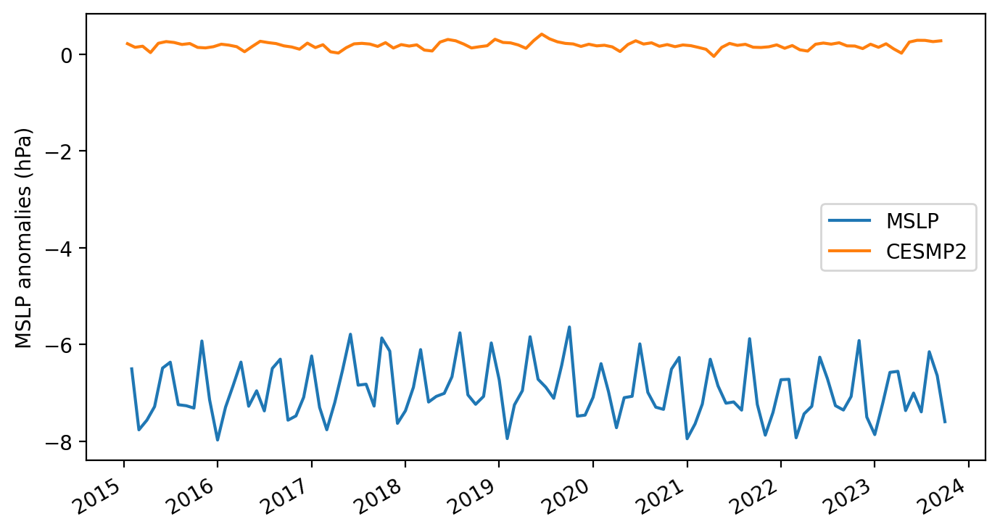

In [168]:
# Plot anomalies in the common period
mslp_monthly_w.mean(['lat', 'lon']).sel({'time': slice(start, end)}).anomalies.plot(label='MSLP')
model_w.mean(['lat', 'lon']).sel({'time': slice(start, end)}).anomalies.plot(label='CESMP2')
plt.xlabel('')
plt.ylabel('MSLP anomalies (hPa)')
plt.legend()

In [169]:
# Compute the global time series of the anomalies for every dataset
a = mslp_monthly_w.mean(['lat', 'lon']).sel({'time': slice(start, end)}).anomalies
b = model_w.mean(['lat', 'lon']).sel({'time': slice(start, end)}).anomalies

In [170]:
# Verify if the difference between ERA5 and CESMP2 best is statistically significant (test hypothesis with confidence of 95%)
diff_ab = a.mean('time') - b.mean('time')
pvalue_ab = stats.ttest_ind(a, b, equal_var = False).pvalue

print(f'The difference in average between the two periods is {round(diff_ab.values.tolist(), 3)} with a pvalue of {round(pvalue_ab, 4)}')

The difference in average between the two periods is -7.147 with a pvalue of 0.0


The pvalues are smaller than 0.05 so we reject the null hypothsis, so the differences are statistically significant. There are many possible reason that can explain these differences. Regarding the GPCC dataset the major error sources affecting gridded precipitation estimates based on rain gauge measurements are:

The systematic gauge-measuring error resulting from evaporation out of the rain gauge and aerodynamic effects, when droplets or snow flakes are drifted by the wind across the gauge funnel
The sampling error depending on the network density
The systematic gauge-measuring error is generally an undercatch of the true precipitation (Sevruk 1982, 1985). Parameters affecting the efficiency of gauge measurement are features of the instrument used (size, shape, exposition, etc.) and the meteorological conditions (wind, air temperature, humidity, radiation) during the precipitation event. The precipitation phase (liquid, solid, mixed), as well as the intensity (i.e., drizzle, shower) of a precipitation event, plays an important role, too.

GPCC dataset in not bias corrected for systematic gauge measuring errors.

## Spatial Aggregation

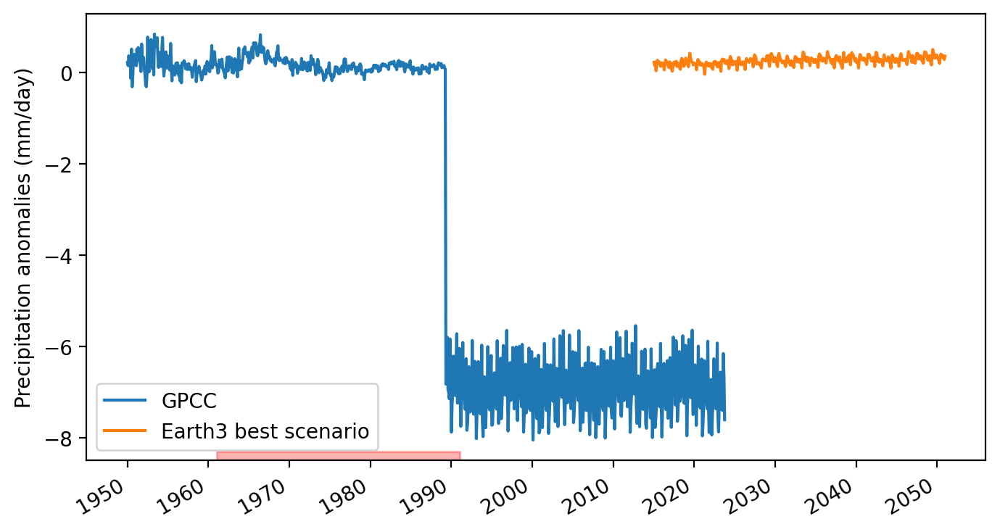

In [172]:
# Plot the global anomalies of the 3 datasets
fig, ax = plt.subplots()
mslp_monthly_near_w.mean(['lat', 'lon']).anomalies.plot(label='GPCC')
model_w.mean(['lat', 'lon']).anomalies.plot(label='Earth3 best scenario')
plt.xlabel('')
plt.ylabel('Precipitation anomalies (mm/day)')
plt.legend()
ax.xaxis.set_major_locator(mdates.YearLocator(10))

plt.axvspan(datetime(1961,1,1), datetime(1990,12,31), ymax=0.02, color="red", alpha=0.3)

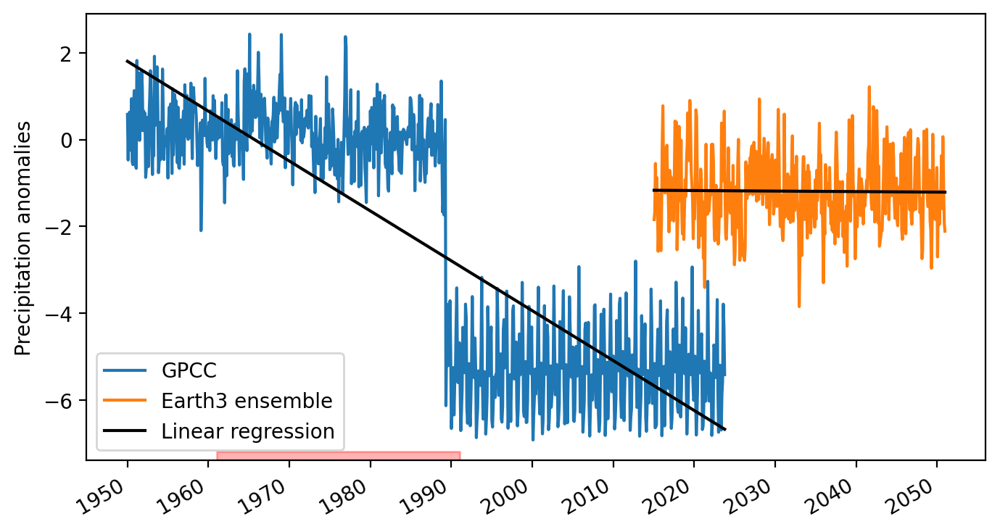

In [173]:
# Plot the the time series with linear regression

# Anomalies
anom1 = mslp_monthly_near.anomalies.mean(['lat', 'lon'])
anom2 = model.anomalies.mean(['lat', 'lon'])

# Linear regression
x1 = np.arange(mslp_monthly_near.time.size)
x2 = np.arange(model.time.size)

fit1 = np.polyfit(x1, anom1, 1)
fit2 = np.polyfit(x2, anom2, 1)

fit_func1 = np.poly1d(fit1)
fit_func2 = np.poly1d(fit2)

# Plot time series
fig, ax = plt.subplots()
anom1.plot(label='GPCC')
anom2.plot(label='Earth3 ensemble')

# Plot linear regression
ax.plot(mslp_monthly_near.time, fit_func1(x1), color='black', label='Linear regression')
ax.plot(model.time, fit_func2(x2), color='black')

plt.xlabel('')
plt.ylabel('Precipitation anomalies')
plt.legend()
ax.xaxis.set_major_locator(mdates.YearLocator(10))

plt.axvspan(datetime(1961,1,1), datetime(1990,12,31), ymax=0.02, color="red", alpha=0.3)


## Statistical Analysis